# 1. SynthCity Testing

In [ ]:
!pip install synthcity

In [ ]:
# stdlib
import sys
import warnings

# synthcity absolute
import synthcity.logger as log
from synthcity.plugins import Plugins
from synthcity.plugins.core.dataloader import TimeSeriesSurvivalDataLoader

log.add(sink=sys.stderr, level="INFO")
warnings.filterwarnings("ignore")

[KeOps] Compiling cuda jit compiler engine ... OK
[pyKeOps] Compiling nvrtc binder for python ... OK


In [ ]:
import numpy as np
from synthcity.utils.datasets.time_series.pbc import PBCDataloader

(
    static_surv,
    temporal_surv,
    temporal_surv_horizons,
    outcome_surv,
) = PBCDataloader().load()
T, E = outcome_surv

horizons = [0.25, 0.5, 0.75]
time_horizons = np.quantile(T, horizons).tolist()

loader = TimeSeriesSurvivalDataLoader(
    temporal_data=temporal_surv,
    observation_times=temporal_surv_horizons,
    static_data=static_surv,
    T=T,
    E=E,
    time_horizons=time_horizons,
)

loader.dataframe()

,seq_id,seq_time_id,seq_static_sex,seq_temporal_SGOT,seq_temporal_age,seq_temporal_albumin,seq_temporal_alkaline,seq_temporal_ascites,seq_temporal_drug,seq_temporal_edema,seq_temporal_hepatomegaly,seq_temporal_histologic,seq_temporal_platelets,seq_temporal_prothrombin,seq_temporal_serBilir,seq_temporal_serChol,seq_temporal_spiders,seq_out_time_to_event,seq_out_event
0,0,0.569489,0.0,-1.485263,0.248058,-0.894575,0.195532,1.0,0.0,1.0,1.0,3.0,-0.529101,0.136768,3.281890,0.000000,1.0,0.569489,1.0
1,0,1.095170,0.0,0.195488,0.248058,-1.570646,0.285613,1.0,0.0,1.0,1.0,3.0,-0.456022,0.813132,2.015877,-0.469461,1.0,0.569489,1.0
2,1,5.319790,0.0,-0.442126,1.292856,-1.431455,-0.605844,1.0,0.0,1.0,1.0,2.0,-1.395605,0.339677,0.172710,-0.658914,1.0,14.152338,0.0
3,1,6.261636,0.0,-0.046806,1.292856,-1.172958,-0.512364,1.0,0.0,1.0,1.0,2.0,-1.259888,0.339677,-0.013468,-0.603657,1.0,14.152338,0.0
4,1,7.266455,0.0,0.293680,1.292856,-1.312149,-0.443529,1.0,0.0,1.0,1.0,2.0,-1.364286,0.339677,0.098239,0.000000,1.0,14.152338,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1940,311,1.045888,0.0,0.986129,-1.962482,0.059878,1.385274,0.0,1.0,2.0,0.0,2.0,-1.103291,1.624769,3.672865,3.319599,1.0,3.989158,0.0
1941,311,1.867265,0.0,0.641817,-1.962482,-0.099197,0.916176,0.0,1.0,2.0,0.0,1.0,-0.998892,1.354223,2.350998,2.901224,1.0,3.989158,0.0
1942,311,2.921367,0.0,0.552551,-1.962482,0.338261,0.327254,0.0,1.0,0.0,0.0,1.0,-0.894494,0.474950,0.694010,-0.066873,0.0,3.989158,0.0
1943,311,3.425145,0.0,0.016956,-1.962482,-0.377580,0.251620,0.0,1.0,0.0,0.0,1.0,-0.466462,-0.066141,0.340271,0.000000,0.0,3.989158,0.0


In [ ]:
# synthcity absolute
from synthcity.plugins import Plugins

Plugins(categories=["generic", "time_series"]).list()

[2023-06-14T22:29:06.861061+0000][741][CRITICAL] module disabled: /usr/local/lib/python3.10/dist-packages/synthcity/plugins/generic/plugin_goggle.py
[2023-06-14T22:29:06.861061+0000][741][CRITICAL] module disabled: /usr/local/lib/python3.10/dist-packages/synthcity/plugins/generic/plugin_goggle.py


['bayesian_network',
 'ctgan',
 'fflows',
 'timevae',
 'ddpm',
 'nflow',
 'timegan',
 'rtvae',
 'tvae']

In [ ]:
# synthcity absolute
from synthcity.plugins import Plugins

syn_model = Plugins().get("timegan")

syn_model.fit(loader)

[2023-06-14T22:29:07.705805+0000][741][CRITICAL] module disabled: /usr/local/lib/python3.10/dist-packages/synthcity/plugins/generic/plugin_goggle.py
 46%|████▌     | 460/1000 [06:04<06:18,  1.43it/s]

In [ ]:
syn_model.generate(count=10).dataframe()

In [ ]:
# third party
import matplotlib.pyplot as plt

syn_model.plot(plt, loader)

plt.show()

In [ ]:
# synthcity absolute
from synthcity.benchmark import Benchmarks

score = Benchmarks.evaluate(
    [
        (f"test_{model}", model, {})
        for model in ["adsgan", "timegan", "probabilistic_ar"]
    ],
    loader,
    synthetic_size=1000,
    repeats=2,
    task_type="time_series_survival",  # time_series_survival or time_series
)

In [ ]:
Benchmarks.print(score)


# 2. SurvTrace Testing On SynthCity Processing

## 2.1 On Support2 Dataset

_____ Github Test

In [ ]:
!git clone https://github.com/RyanWangZf/SurvTRACE

Cloning into 'SurvTRACE'...
remote: Enumerating objects: 87, done.
remote: Counting objects: 100% (87/87), done.
remote: Compressing objects: 100% (67/67), done.
remote: Total 87 (delta 39), reused 58 (delta 18), pack-reused 0
Unpacking objects: 100% (87/87), 146.75 KiB | 530.00 KiB/s, done.


In [ ]:
!pip install -r /content/SurvTRACE/requirements.txt

  Using cached easydict-1.9.tar.gz (6.4 kB)
  Preparing metadata (setup.py) ... done
  Using cached scikit-survival-0.14.0.tar.gz (2.3 MB)
  error: subprocess-exited-with-error
  
  × pip subprocess to install build dependencies did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Installing build dependencies ... error
error: subprocess-exited-with-error

× pip subprocess to install build dependencies did not run successfully.
│ exit code: 1
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.


In [ ]:
%cd /content/SurvTRACE

/content/SurvTRACE


In [ ]:
!pwd

/content/SurvTRACE


In [ ]:
%cd survtrace

/content/SurvTRACE/survtrace


In [ ]:
!pip install scikit-survival
!pip install torchtuples
!pip install pycox

In [ ]:
import pdb
from collections import defaultdict
import matplotlib.pyplot as plt

from SurvTRACE.survtrace.dataset import load_data
from SurvTRACE.survtrace.evaluate_utils import Evaluator
from SurvTRACE.survtrace.utils import set_random_seed
from SurvTRACE.survtrace.model import SurvTraceSingle
from SurvTRACE.survtrace.train_utils import Trainer
from SurvTRACE.survtrace.config import STConfig

In [ ]:
# define the setup parameters
STConfig['data'] = 'support'

set_random_seed(STConfig['seed'])

hparams = {
    'batch_size': 128,
    'weight_decay': 0,
    'learning_rate': 1e-3,
    'epochs': 20,
}

In [ ]:
STConfig['data']

'support'

In [ ]:
# load data
df, df_train, df_y_train, df_test, df_y_test, df_val, df_y_val = load_data(STConfig)

In [ ]:
df

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,duration,event
0,82.709961,1.0,2.0,1.0,0.0,0.0,0.0,160.0,55.0,16.0,38.195309,142.0,19.000000,1.099854,30.0,1
1,79.660950,1.0,0.0,1.0,0.0,0.0,1.0,54.0,67.0,16.0,38.000000,142.0,10.000000,0.899902,1527.0,0
2,23.399990,1.0,2.0,3.0,0.0,0.0,1.0,87.0,144.0,45.0,37.296879,130.0,5.199219,1.199951,96.0,1
3,53.075989,1.0,4.0,3.0,0.0,0.0,0.0,55.0,100.0,18.0,36.000000,135.0,8.699219,0.799927,892.0,0
4,71.794983,0.0,1.0,1.0,0.0,0.0,0.0,65.0,135.0,40.0,38.593750,146.0,0.099991,0.399963,7.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8868,81.064941,0.0,4.0,1.0,0.0,0.0,1.0,111.0,110.0,34.0,39.593750,135.0,13.000000,1.500000,36.0,1
8869,72.560966,0.0,2.0,1.0,0.0,0.0,1.0,53.0,74.0,28.0,34.695309,139.0,7.899414,1.899902,49.0,1
8870,63.228001,0.0,1.0,1.0,0.0,0.0,2.0,95.0,110.0,22.0,38.695309,132.0,7.799805,1.500000,6.0,1
8871,75.405937,0.0,2.0,1.0,1.0,0.0,2.0,109.0,110.0,30.0,36.195309,140.0,15.398438,0.899902,10.0,1


In [ ]:
df_train

,x1,x2,x3,x4,x5,x6,x0,x7,x8,x9,x10,x11,x12,x13
0,1.0,4.0,13.0,18.0,20.0,22.0,1.285896,2.712545,-1.340135,-0.764142,0.862546,0.730526,0.716630,-0.399353
3,1.0,6.0,15.0,18.0,20.0,22.0,-0.611591,-1.061305,0.079626,-0.556379,-0.885730,-0.422642,-0.394241,-0.576414
4,0.0,3.0,13.0,18.0,20.0,22.0,0.587001,-0.701891,1.183885,1.729010,1.179852,1.389479,-1.321610,-0.812530
7,1.0,6.0,13.0,18.0,20.0,24.0,0.565421,-0.594067,0.142727,0.066909,-1.283914,-0.587380,-0.340319,-0.222221
12,0.0,3.0,13.0,18.0,20.0,23.0,0.848373,-1.780134,2.761398,-1.387430,0.464361,-0.752118,0.532959,1.253641
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8864,0.0,4.0,13.0,19.0,20.0,23.0,-0.950315,-0.054945,-0.803781,0.066909,-1.283914,1.718956,0.447022,-0.340261
8866,0.0,3.0,13.0,18.0,20.0,23.0,-1.639222,-0.701891,1.057684,2.975586,1.179852,2.048432,-0.038273,0.072951
8868,0.0,6.0,13.0,18.0,20.0,23.0,1.180564,0.951415,0.395129,1.105722,1.976221,-0.422642,0.069570,-0.163129
8870,0.0,3.0,13.0,18.0,20.0,24.0,0.038450,0.376352,0.395129,-0.140854,1.260731,-0.916857,-0.491236,-0.163129


In [ ]:
df_y_train

,duration,event,proportion
0,1,1.0,0.372093
3,3,0.0,0.360787
4,0,1.0,0.500000
7,3,0.0,0.719466
12,3,1.0,0.087561
...,...,...,...
8864,3,0.0,0.201124
8866,3,0.0,0.289951
8868,1,1.0,0.511628
8870,0,1.0,0.428571


In [ ]:
from google.colab import drive, files

files.upload()

Saving support2_merged_survgan_auton.csv to support2_merged_survgan_auton.csv


{'support2_merged_survgan_auton.csv': b'event,time,age,num.co,meanbp,wblc,hrt,resp,temp,pafi,alb,bili,crea,sod,ph,glucose,bun,urine,adlp,adls,sex_male,dzgroup_CHF,dzgroup_COPD,dzgroup_Cirrhosis,dzgroup_Colon Cancer,dzgroup_Coma,dzgroup_Lung Cancer,dzgroup_MOSF w/Malig,dzclass_COPD/CHF/Cirrhosis,dzclass_Cancer,dzclass_Coma,income_$25-$50k,income_>$50k,income_under $11k,race_black,race_hispanic,race_other,race_white,ca_no,ca_yes\n0,2029,0.012772330486296448,-1.3900129918869335,0.4498374195488454,-0.693182131165662,-0.8922825085550503,-0.1389667955622037,-0.8815035897892463,1.5690189699982824,-1.6556863376223867,-0.5238336583117309,-0.33994057722239684,0.569190638366079,0.6396076682534062,0.0,3.670981146154617e-16,4.578133715224604e-16,5.4452104368076055,2.9037524011944447,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0\n1,4,-0.1482623380516463,0.09771103434211671,-1.5007019101146704,0.5187095962398524,0.47038189047351575,1.1145914970296242,-2.0050133225535673,-1.4956584095046166,-6.3897011675217

In [ ]:
import pandas as pd
from SurvTRACE.survtrace.utils import LabelTransform
from sklearn.preprocessing import KBinsDiscretizer, LabelEncoder, StandardScaler

get_target = lambda df: (df['duration'].values, df['event'].values)
df = pd.read_csv("/content/SurvTRACE/survtrace/support2_merged_adsgan_auton.csv")

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14568 entries, 0 to 14567
Data columns (total 40 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   event                       14568 non-null  int64  
 1   time                        14568 non-null  int64  
 2   age                         14568 non-null  float64
 3   num.co                      14568 non-null  float64
 4   meanbp                      14568 non-null  float64
 5   wblc                        14568 non-null  float64
 6   hrt                         14568 non-null  float64
 7   resp                        14568 non-null  float64
 8   temp                        14568 non-null  float64
 9   pafi                        14568 non-null  float64
 10  alb                         14568 non-null  float64
 11  bili                        14568 non-null  float64
 12  crea                        14568 non-null  float64
 13  sod                         145

In [ ]:
df.head()

,Unnamed: 0,event,time,age,num.co,meanbp,wblc,hrt,resp,temp,...,dzclass_Coma,income_$25-$50k,income_>$50k,income_under $11k,race_black,race_hispanic,race_other,race_white,ca_no,ca_yes
0,0,0,2029,0.012772,-1.390013,0.449837,-0.693182,-0.892283,-0.138967,-0.881504,...,0,0,0,0,0,0,1,0,0,0
1,1,1,4,-0.148262,0.097711,-1.500702,0.518710,0.470382,1.114591,-2.005013,...,0,0,0,0,0,0,0,1,1,0
2,2,1,47,-0.635153,0.097711,-0.525432,-0.420176,-0.290175,0.487812,0.235766,...,0,0,0,1,0,0,0,1,1,0
3,3,1,133,-1.299688,0.097711,-0.344827,-0.354697,-0.290175,0.905665,-1.680444,...,0,0,0,1,0,0,0,1,0,0
4,4,0,2029,1.105258,-0.646151,-0.922764,0.125837,0.470382,-0.347893,0.635237,...,0,0,0,0,0,0,0,1,1,0


In [ ]:
df = df.drop(columns=['Unnamed: 0'])

In [ ]:
list(df.columns)

In [ ]:
# df = df.replace(np.nan, 0)
# df.rename(columns = {'d.time':'duration', 'death': 'event'}, inplace = True)
df.rename(columns = {'time':'duration'}, inplace = True)

In [ ]:
df.columns[df.isnull().any()].tolist()

[]

In [ ]:
list(df.columns)

['event',
 'duration',
 'age',
 'num.co',
 'meanbp',
 'wblc',
 'hrt',
 'resp',
 'temp',
 'pafi',
 'alb',
 'bili',
 'crea',
 'sod',
 'ph',
 'glucose',
 'bun',
 'urine',
 'adlp',
 'adls',
 'sex_male',
 'dzgroup_CHF',
 'dzgroup_COPD',
 'dzgroup_Cirrhosis',
 'dzgroup_Colon Cancer',
 'dzgroup_Coma',
 'dzgroup_Lung Cancer',
 'dzgroup_MOSF w/Malig',
 'dzclass_COPD/CHF/Cirrhosis',
 'dzclass_Cancer',
 'dzclass_Coma',
 'income_$25-$50k',
 'income_>$50k',
 'income_under $11k',
 'race_black',
 'race_hispanic',
 'race_other',
 'race_white',
 'ca_no',
 'ca_yes']

In [ ]:
import numpy as np
from SurvTRACE.survtrace.config import STConfig
def test_support2(df):
  horizons = [.25, .5, .75]
  times = np.quantile(df["duration"][df["event"]==1.0], horizons).tolist()
  cols_categorical = ['sex_male', 'dzgroup_CHF', 'dzgroup_COPD', 'dzgroup_Cirrhosis', 'dzgroup_Colon Cancer', 'dzgroup_Coma', 'dzgroup_Lung Cancer', 'dzgroup_MOSF w/Malig', 'dzclass_COPD/CHF/Cirrhosis',
 'dzclass_Cancer', 'dzclass_Coma', 'income_$25-$50k', 'income_>$50k', 'income_under $11k', 'race_black', 'race_hispanic', 'race_other', 'race_white', 'ca_no', 'ca_yes']
  cols_standardize = ['age','num.co','meanbp','wblc','hrt','resp','temp','pafi','alb','bili','crea','sod','ph','glucose','bun','urine','adlp','adls']

  # cols_categorical = ['sex', 'dzgroup', 'dzclass', 'income', 'race', 'ca']
  # cols_standardize = ['age', 'num.co', 'meanbp', 'wblc', 'hrt', 'resp',
	#      'temp', 'pafi', 'alb', 'bili', 'crea', 'sod', 'ph',
  #            'glucose', 'bun', 'urine', 'adlp', 'adls']



  df_feat = df.drop(["duration","event"],axis=1)
  df_feat_standardize = df_feat[cols_standardize]
  df_feat_standardize_disc = StandardScaler().fit_transform(df_feat_standardize)
  df_feat_standardize_disc = pd.DataFrame(df_feat_standardize_disc, columns=cols_standardize)

  df_feat = pd.concat([df_feat[cols_categorical], df_feat_standardize], axis=1)

  vocab_size = 0
  for i,feat in enumerate(cols_categorical):
      df_feat[feat] = LabelEncoder().fit_transform(df_feat[feat]).astype(float) + vocab_size
      vocab_size = df_feat[feat].max() + 1

  # get the largest duraiton time
  max_duration_idx = df["duration"].argmax()
  # df_test = df_feat.drop(max_duration_idx).sample(frac=0.2)
  # df_train = df_feat.drop(df_test.index)
  # df_val = df_train.drop(max_duration_idx).sample(frac=0.2)
  # df_train = df_train.drop(df_val.index)

  # # Hung edited here
  df_train = df_feat.iloc[3642:] #
  df_train = df_train.sample(frac=1)

  df_remaining = df_feat.iloc[:3641] #
  df_remaining = df_remaining.sample(frac=1)

  # Now let's say you want to split the remaining data into test and validation sets
  df_test = df_remaining.sample(frac=0.5) # 20% of the training data for testing
  df_val = df_remaining.drop(df_test.index) # 20% of the training data for validating


  # assign cuts
  # labtrans = LabTransDiscreteTime(cuts=np.array([0]+times+[df["duration"].max()]))
  labtrans = LabelTransform(cuts=np.array([0]+times+[df["duration"].max()]))

  labtrans.fit(*get_target(df.loc[df_train.index]))
  # y = labtrans.fit_transform(*get_target(df)) # y = (discrete duration, event indicator)
  y = labtrans.transform(*get_target(df)) # y = (discrete duration, event indicator)
  df_y_train = pd.DataFrame({"duration": y[0][df_train.index], "event": y[1][df_train.index], "proportion":y[2][df_train.index]}, index=df_train.index)
  df_y_val = pd.DataFrame({"duration": y[0][df_val.index], "event": y[1][df_val.index], "proportion":y[2][df_val.index]}, index=df_val.index)
  # df_y_test = pd.DataFrame({"duration": y[0][df_test.index], "event": y[1][df_test.index], "proportion":y[2][df_test.index]}, index=df_test.index)
  df_y_test = pd.DataFrame({"duration": df['duration'].loc[df_test.index], "event": df['event'].loc[df_test.index]})
  STConfig['labtrans'] = labtrans
  STConfig['num_numerical_feature'] = int(len(cols_standardize))
  STConfig['num_categorical_feature'] = int(len(cols_categorical))
  STConfig['num_feature'] = int(len(df_train.columns))
  STConfig['vocab_size'] = int(vocab_size)
  STConfig['duration_index'] = labtrans.cuts
  STConfig['out_feature'] = int(labtrans.out_features)
  print("______")
  print(int(len(cols_standardize)))
  print("______")
  print(int(len(cols_categorical)))
  print("______")
  print(int(len(df_train.columns)))
  print("______")
  print(int(vocab_size))
  print("______")
  print(labtrans.cuts)
  print("______")
  print(int(labtrans.out_features))

  return y, df, df_train, df_y_train, df_test, df_y_test, df_val, df_y_val

In [ ]:
y, df, df_train, df_y_train, df_test, df_y_test, df_val, df_y_val = test_support2(df)

______
18
______
20
______
38
______
40
______
[   0.   20.   60.  183. 2029.]
______
4


In [ ]:
df_train.head()

,sex_male,dzgroup_CHF,dzgroup_COPD,dzgroup_Cirrhosis,dzgroup_Colon Cancer,dzgroup_Coma,dzgroup_Lung Cancer,dzgroup_MOSF w/Malig,dzclass_COPD/CHF/Cirrhosis,dzclass_Cancer,...,alb,bili,crea,sod,ph,glucose,bun,urine,adlp,adls
4038,0.0,2.0,4.0,6.0,8.0,10.0,12.0,14.0,16.0,18.0,...,-6.389701e-16,9.880260e-17,-0.578088,-0.260181,1.353911e+00,0.000000,3.670981e-16,4.578134e-16,2.069601e-16,0.196350
5628,0.0,2.0,4.0,6.0,8.0,10.0,12.0,14.0,16.0,18.0,...,2.145153e-01,-4.348415e-01,-0.518569,-0.426055,-1.273825e-14,2.452106,-1.103009e+00,3.532109e+00,2.069601e-16,-0.886611
4030,1.0,2.0,4.0,6.0,9.0,10.0,12.0,14.0,16.0,19.0,...,-6.389701e-16,-1.901149e-01,-0.697126,0.403316,1.059785e+00,0.000000,3.670981e-16,4.578134e-16,2.069601e-16,-0.345131
4885,1.0,2.0,4.0,6.0,8.0,10.0,12.0,14.0,16.0,18.0,...,-6.389701e-16,-4.348415e-01,-0.458978,0.071568,-1.273825e-14,-0.904838,-8.963508e-01,4.578134e-16,2.069601e-16,1.820791
6426,1.0,2.0,4.0,7.0,8.0,10.0,12.0,14.0,17.0,18.0,...,-7.282984e-02,3.146977e+00,0.314838,-1.587175,-9.430599e-01,0.000000,3.670981e-16,4.578134e-16,2.069601e-16,-0.345131


In [ ]:
df_y_train.head()

,duration,event,proportion
4974,0,1.0,0.428571
6092,3,1.0,0.625211
5141,3,0.0,0.225098
4079,2,1.0,0.082474
8963,3,0.0,0.151941


In [ ]:
print(len(list(df_train.columns)))
print(len(list(df.columns)))

24
48


In [ ]:
print(df_y_val.isnull().values.any())
print(df_y_train.isnull().values.any())
print(df_y_test.isnull().values.any())

False
False
False


In [ ]:
df_train = df_train.replace(np.nan, 0.0)
df_y_train = df_y_train.replace(np.nan, 0.0)
df_test = df_test.replace(np.nan, 0.0)
df_val = df_val.replace(np.nan, 0.0)

In [ ]:
# get model
model = SurvTraceSingle(STConfig)

# initialize a trainer
trainer = Trainer(model)
train_loss, val_loss = trainer.fit((df_train, df_y_train), (df_val, df_y_val),
        batch_size=hparams['batch_size'],
        epochs=hparams['epochs'],
        learning_rate=hparams['learning_rate'],
        weight_decay=hparams['weight_decay'],)

use pytorch-cuda for training.
[Train-0]: 64.17660284042358
[Val-0]: 1.7246181964874268
[Train-1]: 52.419026017189026
[Val-1]: 1.2811253070831299
[Train-2]: 51.50853908061981
[Val-2]: 1.2635849714279175
[Train-3]: 51.168641209602356
[Val-3]: 1.2522121667861938
[Train-4]: 50.933754444122314
[Val-4]: 1.250821828842163
[Train-5]: 50.799331188201904
[Val-5]: 1.2626510858535767
EarlyStopping counter: 1 out of 5
[Train-6]: 50.765531063079834
[Val-6]: 1.2498242855072021
[Train-7]: 50.65985894203186
[Val-7]: 1.2516965866088867
EarlyStopping counter: 1 out of 5
[Train-8]: 50.602309346199036
[Val-8]: 1.2692835330963135
EarlyStopping counter: 2 out of 5
[Train-9]: 50.391034722328186
[Val-9]: 1.2597016096115112
EarlyStopping counter: 3 out of 5
[Train-10]: 50.38861274719238
[Val-10]: 1.2543671131134033
EarlyStopping counter: 4 out of 5
[Train-11]: 50.17520594596863
[Val-11]: 1.2553260326385498
EarlyStopping counter: 5 out of 5
early stops at epoch 12


In [ ]:
df

,event,duration,age,num.co,meanbp,wblc,hrt,resp,temp,pafi,...,dzclass_Coma,income_$25-$50k,income_>$50k,income_under $11k,race_black,race_hispanic,race_other,race_white,ca_no,ca_yes
0,0,2029,0.012772,-1.390013,0.449837,-6.931821e-01,-0.892283,-0.138967,-0.881504,1.569019e+00,...,0,0,0,0,0,0,1,0,0,0
1,1,4,-0.148262,0.097711,-1.500702,5.187096e-01,0.470382,1.114591,-2.005013,-1.495658e+00,...,0,0,0,0,0,0,0,1,1,0
2,1,47,-0.635153,0.097711,-0.525432,-4.201759e-01,-0.290175,0.487812,0.235766,-8.319880e-02,...,0,0,0,1,0,0,0,1,1,0
3,1,133,-1.299688,0.097711,-0.344827,-3.546971e-01,-0.290175,0.905665,-1.680444,-3.003564e-16,...,0,0,0,1,0,0,0,1,0,0
4,0,2029,1.105258,-0.646151,-0.922764,1.258366e-01,0.470382,-0.347893,0.635237,-6.997670e-01,...,0,0,0,0,0,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9100,0,350,0.219471,-0.646151,0.883291,-5.403626e-01,0.216863,-0.138967,-1.124933,4.276908e-01,...,0,0,0,0,0,0,0,1,1,0
9101,0,347,-0.480786,-0.646151,-1.500702,1.939826e-16,-3.078884,-1.601451,1.190748,-2.222321e-01,...,1,0,0,0,0,0,0,1,1,0
9102,0,346,0.495813,-0.646151,0.955533,-4.312668e-01,-0.448624,0.069960,-0.325992,-6.290945e-01,...,0,0,0,0,0,0,0,1,1,0
9103,1,7,-1.002436,-0.646151,0.522080,-5.185008e-01,0.407002,0.069960,-0.563174,1.997678e+00,...,0,0,0,0,0,0,0,1,0,1


In [ ]:
df_train

,x1,x2,x3,x4,x5,x6,x0,x7,x8,x9,x10,x11,x12,x13
0,1.0,4.0,13.0,18.0,20.0,22.0,1.285896,2.712545,-1.340135,-0.764142,0.862546,0.730526,0.716630,-0.399353
3,1.0,6.0,15.0,18.0,20.0,22.0,-0.611591,-1.061305,0.079626,-0.556379,-0.885730,-0.422642,-0.394241,-0.576414
4,0.0,3.0,13.0,18.0,20.0,22.0,0.587001,-0.701891,1.183885,1.729010,1.179852,1.389479,-1.321610,-0.812530
7,1.0,6.0,13.0,18.0,20.0,24.0,0.565421,-0.594067,0.142727,0.066909,-1.283914,-0.587380,-0.340319,-0.222221
12,0.0,3.0,13.0,18.0,20.0,23.0,0.848373,-1.780134,2.761398,-1.387430,0.464361,-0.752118,0.532959,1.253641
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8864,0.0,4.0,13.0,19.0,20.0,23.0,-0.950315,-0.054945,-0.803781,0.066909,-1.283914,1.718956,0.447022,-0.340261
8866,0.0,3.0,13.0,18.0,20.0,23.0,-1.639222,-0.701891,1.057684,2.975586,1.179852,2.048432,-0.038273,0.072951
8868,0.0,6.0,13.0,18.0,20.0,23.0,1.180564,0.951415,0.395129,1.105722,1.976221,-0.422642,0.069570,-0.163129
8870,0.0,3.0,13.0,18.0,20.0,24.0,0.038450,0.376352,0.395129,-0.140854,1.260731,-0.916857,-0.491236,-0.163129


In [ ]:
df_y_train

,duration,event,proportion
0,1,1.0,0.372093
3,3,0.0,0.360787
4,0,1.0,0.500000
7,3,0.0,0.719466
12,3,1.0,0.087561
...,...,...,...
8864,3,0.0,0.201124
8866,3,0.0,0.289951
8868,1,1.0,0.511628
8870,0,1.0,0.428571


In [ ]:
# evaluate model
evaluator = Evaluator(df, df_train.index)
evaluator.eval(model, (df_test, df_y_test))
print("done")

******************************
start evaluation
******************************
For 0.25 quantile,
TD Concordance Index - IPCW: 0.7797936768126895
Brier Score: 0.11853874671713349
For 0.5 quantile,
TD Concordance Index - IPCW: 0.7460831017947088
Brier Score: 0.17895413193514936
For 0.75 quantile,
TD Concordance Index - IPCW: 0.7022328694620977
Brier Score: 0.20452578358838633
done


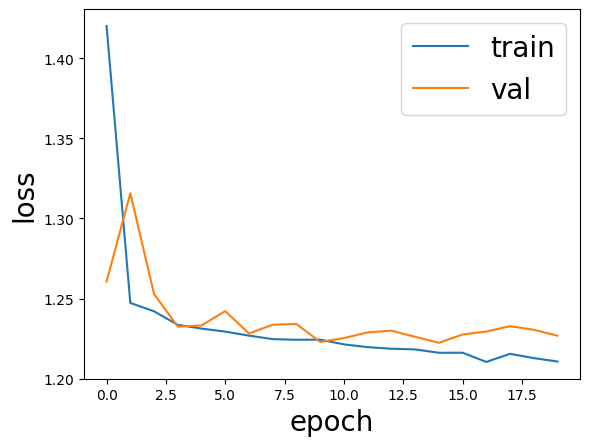

In [ ]:
plt.plot(train_loss, label='train')
plt.plot(val_loss, label='val')
plt.legend(fontsize=20)
plt.xlabel('epoch',fontsize=20)
plt.ylabel('loss', fontsize=20)
plt.show()

## 2.2 On Metabric Dataset

In [ ]:
!git clone https://github.com/RyanWangZf/SurvTRACE

Cloning into 'SurvTRACE'...
remote: Enumerating objects: 87, done.
remote: Counting objects: 100% (87/87), done.
remote: Compressing objects: 100% (67/67), done.
remote: Total 87 (delta 39), reused 58 (delta 18), pack-reused 0
Unpacking objects: 100% (87/87), 146.75 KiB | 4.45 MiB/s, done.


In [ ]:
!pip install -r /content/SurvTRACE/requirements.txt

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 37.3 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × pip subprocess to install build dependencies did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Installing build dependencies ... error
error: subprocess-exited-with-error

× pip subprocess to install build dependencies did not run successfully.
│ exit code: 1
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.


In [ ]:
%cd /content/SurvTRACE

/content/SurvTRACE


In [ ]:
!pwd

/content/SurvTRACE


In [ ]:
%cd survtrace

/content/SurvTRACE/survtrace


In [ ]:
!pip install scikit-survival
!pip install torchtuples
!pip install pycox

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 41.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.9/41.9 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.7/73.7 kB 8.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 100.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 412.3/412.3 kB 45.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.8/138.8 kB 20.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.8/49.8 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 68.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.1/93.1 kB 14.6 MB/s eta 0:00:00
  Created wheel for feather-format: filename=feather_format-0.4.1-py3-none-any.whl size=2440 sha256=433bc516135ec278a52669ed48fc06bdb5211adc079cce7e19ca214693

In [ ]:
import math
import os
import random
import itertools


import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from google.colab import drive, files

import torch

In [ ]:
import pdb
from collections import defaultdict
import matplotlib.pyplot as plt

from SurvTRACE.survtrace.dataset import load_data
from SurvTRACE.survtrace.evaluate_utils import Evaluator
from SurvTRACE.survtrace.utils import set_random_seed
from SurvTRACE.survtrace.model import SurvTraceSingle
from SurvTRACE.survtrace.train_utils import Trainer
from SurvTRACE.survtrace.config import STConfig

# define the setup parameters
STConfig['data'] = 'metabric'

set_random_seed(STConfig['seed'])

hparams = {
    'batch_size': 64,
    'weight_decay': 1e-4,
    'learning_rate': 1e-3,
    'epochs': 20,
}

In [ ]:
STConfig['data']

'metabric'

In [ ]:
df, df_train, df_y_train, df_test, df_y_test, df_val, df_y_val = load_data(STConfig)

Dataset 'metabric' not locally available. Downloading...
Done


/content/SurvTRACE/survtrace/utils.py:78: UserWarning: Got event/censoring at start time. Should be removed! It is set s.t. it has no contribution to loss.
  warnings.warn("""Got event/censoring at start time. Should be removed! It is set s.t. it has no contribution to loss.""")


In [ ]:
df.head()

,x0,x1,x2,x3,x4,x5,x6,x7,x8,duration,event
0,5.603834,7.811392,10.797988,5.967607,1.0,1.0,0.0,1.0,56.840000,99.333336,0
1,5.284882,9.581043,10.204620,5.664970,1.0,0.0,0.0,1.0,85.940002,95.733330,1
2,5.920251,6.776564,12.431715,5.873857,0.0,1.0,0.0,1.0,48.439999,140.233337,0
3,6.654017,5.341846,8.646379,5.655888,0.0,0.0,0.0,0.0,66.910004,239.300003,0
4,5.456747,5.339741,10.555724,6.008429,1.0,0.0,0.0,1.0,67.849998,56.933334,1


In [ ]:
from google.colab import drive, files

files.upload()

Saving metabric_data_merged_survgan_noauton.csv to metabric_data_merged_survgan_noauton.csv


{'metabric_data_merged_survgan_noauton.csv': b'event,time,stage,grade,grade.1,grade.2,histological,histological.1,histological.2,histological.3,histological.4,histological.5,histological.6,histological.7,histological.8,histological.9,histological.10,histological.11,ER_IHC_status,ER_IHC_status.1,ER_Expr,ER_Expr.1,PR_Expz,PR_Expz.1,HER2_IHC_status,HER2_IHC_status.1,HER2_IHC_status.2,HER2_IHC_status.3,HER2_SNP6_state,HER2_SNP6_state.1,HER2_SNP6_state.2,Her2_Expr,Her2_Expr.1,Treatment,Treatment.1,Treatment.2,Treatment.3,Treatment.4,Treatment.5,Treatment.6,Treatment.7,inf_men_status,inf_men_status.1,group,group.1,group.2,group.3,group.4,cellularity,cellularity.1,cellularity.2,Pam50_Subtype,Pam50_Subtype.1,Pam50_Subtype.2,Pam50_Subtype.3,Pam50_Subtype.4,Pam50_Subtype.5,int_clust_memb,int_clust_memb.1,int_clust_memb.2,int_clust_memb.3,int_clust_memb.4,int_clust_memb.5,int_clust_memb.6,int_clust_memb.7,int_clust_memb.8,int_clust_memb.9,site,site.1,site.2,site.3,site.4,Genefu,Genefu.1,Genefu.2,

In [ ]:
import pandas as pd
from SurvTRACE.survtrace.utils import LabelTransform
from sklearn.preprocessing import KBinsDiscretizer, LabelEncoder, StandardScaler

get_target = lambda df: (df['duration'].values, df['event'].values)
df = pd.read_csv("/content/SurvTRACE/survtrace/metabric_data_merged_survgan_noauton.csv")

In [ ]:
list(df.columns)

['event',
 'time',
 'stage',
 'grade',
 'grade.1',
 'grade.2',
 'histological',
 'histological.1',
 'histological.2',
 'histological.3',
 'histological.4',
 'histological.5',
 'histological.6',
 'histological.7',
 'histological.8',
 'histological.9',
 'histological.10',
 'histological.11',
 'ER_IHC_status',
 'ER_IHC_status.1',
 'ER_Expr',
 'ER_Expr.1',
 'PR_Expz',
 'PR_Expz.1',
 'HER2_IHC_status',
 'HER2_IHC_status.1',
 'HER2_IHC_status.2',
 'HER2_IHC_status.3',
 'HER2_SNP6_state',
 'HER2_SNP6_state.1',
 'HER2_SNP6_state.2',
 'Her2_Expr',
 'Her2_Expr.1',
 'Treatment',
 'Treatment.1',
 'Treatment.2',
 'Treatment.3',
 'Treatment.4',
 'Treatment.5',
 'Treatment.6',
 'Treatment.7',
 'inf_men_status',
 'inf_men_status.1',
 'group',
 'group.1',
 'group.2',
 'group.3',
 'group.4',
 'cellularity',
 'cellularity.1',
 'cellularity.2',
 'Pam50_Subtype',
 'Pam50_Subtype.1',
 'Pam50_Subtype.2',
 'Pam50_Subtype.3',
 'Pam50_Subtype.4',
 'Pam50_Subtype.5',
 'int_clust_memb',
 'int_clust_memb.1',
 'int

In [ ]:
df.columns[df.isnull().any()].tolist()

[]

In [ ]:
df.head()

,event,time,age_at_diagnosis,size,lymph_nodes_positive,stage,lymph_nodes_removed,NPI,grade_1,grade.1_1,grade.2_1,histological_1,histological.1_1,histological.2_1,histological.3_1,histological.4_1,histological.5_1,histological.6_1,histological.7_1,histological.8_1,histological.9_1,histological.10_1,histological.11_1,ER_IHC_status_1,ER_IHC_status.1_1,ER_Expr_1,ER_Expr.1_1,PR_Expz_1,PR_Expz.1_1,HER2_IHC_status_1,HER2_IHC_status.1_1,HER2_IHC_status.2_1,HER2_IHC_status.3_1,HER2_SNP6_state_1,HER2_SNP6_state.1_1,HER2_SNP6_state.2_1,Her2_Expr_1,Her2_Expr.1_1,Treatment_1,Treatment.1_1,...,Treatment.3_1,Treatment.4_1,Treatment.5_1,Treatment.6_1,Treatment.7_1,inf_men_status_1,inf_men_status.1_1,group_1,group.1_1,group.2_1,group.3_1,group.4_1,cellularity_1,cellularity.1_1,cellularity.2_1,Pam50_Subtype_1,Pam50_Subtype.1_1,Pam50_Subtype.2_1,Pam50_Subtype.3_1,Pam50_Subtype.4_1,Pam50_Subtype.5_1,int_clust_memb_1,int_clust_memb.1_1,int_clust_memb.2_1,int_clust_memb.3_1,int_clust_memb.4_1,int_clust_memb.5_1,int_clust_memb.6_1,int_clust_memb.7_1,int_clust_memb.8_1,int_clust_memb.9_1,site_1,site.1_1,site.2_1,site.3_1,site.4_1,Genefu_1,Genefu.1_1,Genefu.2_1,Genefu.3_1
0,1,1735,0.441081,0.710381,2.143909,9.678131e-01,2.432561,1.792752,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,1,0,0,0,1,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0
1,1,3637,1.601112,-0.433376,-0.133506,9.678131e-01,1.676893,0.881634,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,1,0,0,0,0,1,0,1,0,0,...,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0
2,1,936,-0.630362,-0.113669,0.014335,1.291292e-10,0.050307,0.877767,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0,0,1,0,1,1,0,...,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
3,0,4290,1.121641,-0.109059,-0.456326,9.678131e-01,0.131496,-0.822623,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,1,0,0,...,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0
4,0,1876,0.618626,2.896427,-0.112693,1.291292e-10,1.736081,-1.933239,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,1,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0


In [ ]:
df.rename(columns = {'time':'duration'}, inplace = True)
# df.rename(columns = {'event_time':'duration', 'label': 'event'}, inplace = True)


In [ ]:
df.head()

,event,time,stage,grade,grade.1,grade.2,histological,histological.1,histological.2,histological.3,...,site.4,Genefu,Genefu.1,Genefu.2,Genefu.3,age_at_diagnosis,size,lymph_nodes_positive,lymph_nodes_removed,NPI
0,0,2999,2.0,0,0,1,0,1,0,0,...,0,1,0,0,0,75.65,22.0,10.0,16.0,6.04
1,0,1484,1.0,0,0,1,0,1,0,0,...,0,1,0,0,0,43.19,10.0,0.0,25.0,4.02
2,0,3053,2.0,0,1,0,0,1,0,0,...,0,1,0,0,0,48.87,15.0,1.0,12.0,4.03
3,0,1721,2.0,0,1,0,0,1,0,0,...,0,1,0,0,0,47.68,25.0,3.0,21.0,4.05
4,1,1241,2.0,0,0,1,0,1,0,0,...,0,1,0,0,0,76.97,40.0,8.0,8.0,6.08


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3171 entries, 0 to 3170
Data columns (total 81 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   event                 3171 non-null   int64  
 1   duration              3171 non-null   int64  
 2   stage                 3171 non-null   float64
 3   grade                 3171 non-null   int64  
 4   grade.1               3171 non-null   int64  
 5   grade.2               3171 non-null   int64  
 6   histological          3171 non-null   int64  
 7   histological.1        3171 non-null   int64  
 8   histological.2        3171 non-null   int64  
 9   histological.3        3171 non-null   int64  
 10  histological.4        3171 non-null   int64  
 11  histological.5        3171 non-null   int64  
 12  histological.6        3171 non-null   int64  
 13  histological.7        3171 non-null   int64  
 14  histological.8        3171 non-null   int64  
 15  histological.9       

In [ ]:
import numpy as np
from SurvTRACE.survtrace.config import STConfig
def test_metabric(df):
  horizons = [.25, .5, .75]
  times = np.quantile(df["duration"][df["event"]==1.0], horizons).tolist()

  # cols_categorical = ['age_at_diagnosis', 'size', 'lymph_nodes_positive', 'lymph_nodes_removed', 'NPI']
  # cols_standardize = ['stage_1.0','stage_1.190352021','stage_2.0','stage_3.0','stage_4.0','grade_1','grade.1_1','grade.2_1','histological_1','histological.1_1','histological.2_1','histological.3_1','histological.4_1','histological.5_1','histological.6_1','histological.7_1','histological.8_1','histological.9_1','histological.10_1','histological.11_1','ER_IHC_status_1','ER_IHC_status.1_1','ER_Expr_1','ER_Expr.1_1','PR_Expz_1','PR_Expz.1_1','HER2_IHC_status_1','HER2_IHC_status.1_1','HER2_IHC_status.2_1','HER2_IHC_status.3_1','HER2_SNP6_state_1','HER2_SNP6_state.1_1','HER2_SNP6_state.2_1','Her2_Expr_1','Her2_Expr.1_1','Treatment_1','Treatment.1_1','Treatment.2_1','Treatment.3_1','Treatment.4_1','Treatment.5_1','Treatment.6_1','Treatment.7_1','inf_men_status_1','inf_men_status.1_1','group_1','group.1_1','group.2_1','group.3_1','group.4_1','cellularity_1','cellularity.1_1','cellularity.2_1','Pam50_Subtype_1','Pam50_Subtype.1_1','Pam50_Subtype.2_1','Pam50_Subtype.3_1','Pam50_Subtype.4_1','Pam50_Subtype.5_1','int_clust_memb_1','int_clust_memb.1_1','int_clust_memb.2_1','int_clust_memb.3_1','int_clust_memb.4_1','int_clust_memb.5_1','int_clust_memb.6_1','int_clust_memb.7_1','int_clust_memb.8_1','int_clust_memb.9_1','site_1','site.1_1','site.2_1','site.3_1','site.4_1','Genefu_1','Genefu.1_1','Genefu.2_1','Genefu.3_1']

  cols_categorical = ['age_at_diagnosis', 'size', 'lymph_nodes_positive', 'lymph_nodes_removed', 'NPI']
  cols_standardize = ['stage','grade','grade.1','grade.2','histological','histological.1','histological.2','histological.3','histological.4','histological.5','histological.6','histological.7','histological.8','histological.9','histological.10','histological.11','ER_IHC_status','ER_IHC_status.1','ER_Expr','ER_Expr.1','PR_Expz','PR_Expz.1','HER2_IHC_status','HER2_IHC_status.1','HER2_IHC_status.2','HER2_IHC_status.3','HER2_SNP6_state','HER2_SNP6_state.1','HER2_SNP6_state.2','Her2_Expr','Her2_Expr.1','Treatment','Treatment.1','Treatment.2','Treatment.3','Treatment.4','Treatment.5','Treatment.6','Treatment.7','inf_men_status','inf_men_status.1','group','group.1','group.2','group.3','group.4','cellularity','cellularity.1','cellularity.2','Pam50_Subtype','Pam50_Subtype.1','Pam50_Subtype.2','Pam50_Subtype.3','Pam50_Subtype.4','Pam50_Subtype.5','int_clust_memb','int_clust_memb.1','int_clust_memb.2','int_clust_memb.3','int_clust_memb.4','int_clust_memb.5','int_clust_memb.6','int_clust_memb.7','int_clust_memb.8','int_clust_memb.9','site','site.1','site.2','site.3','site.4','Genefu','Genefu.1','Genefu.2','Genefu.3']

  df_feat = df.drop(["duration","event"],axis=1)
  df_feat_standardize = df_feat[cols_standardize]
  df_feat_standardize_disc = StandardScaler().fit_transform(df_feat_standardize)
  df_feat_standardize_disc = pd.DataFrame(df_feat_standardize_disc, columns=cols_standardize)

  # must be categorical feature ahead of numerical features!
  df_feat = pd.concat([df_feat[cols_categorical], df_feat_standardize_disc], axis=1)

  vocab_size = 0
  for _,feat in enumerate(cols_categorical):
      df_feat[feat] = LabelEncoder().fit_transform(df_feat[feat]).astype(float) + vocab_size
      vocab_size = df_feat[feat].max() + 1
  print(vocab_size)

  # get the largest duraiton time
  max_duration_idx = df["duration"].argmax()
  # df_test = df_feat.drop(max_duration_idx).sample(frac=0.2)
  # df_train = df_feat.drop(df_test.index)
  # df_val = df_train.drop(max_duration_idx).sample(frac=0.25)
  # df_train = df_train.drop(df_val.index)


  # # Hung edited here
  df_train = df_feat.iloc[893:] #
  df_train = df_train.sample(frac=1)

  df_remaining = df_feat.iloc[:892] #
  df_remaining = df_remaining.sample(frac=1)

  # Now let's say you want to split the remaining data into test and validation sets
  df_test = df_remaining.sample(frac=0.5) # 20% of the training data for testing
  df_val = df_remaining.drop(df_test.index) # 20% of the training data for validating



  # assign cuts
  labtrans = LabelTransform(cuts=np.array([df["duration"].min()]+times+[df["duration"].max()]))
  labtrans.fit(*get_target(df.loc[df_train.index]))
  y = labtrans.transform(*get_target(df)) # y = (discrete duration, event indicator)
  df_y_train = pd.DataFrame({"duration": y[0][df_train.index], "event": y[1][df_train.index], "proportion": y[2][df_train.index]}, index=df_train.index)
  df_y_val = pd.DataFrame({"duration": y[0][df_val.index], "event": y[1][df_val.index],  "proportion": y[2][df_val.index]}, index=df_val.index)
  # df_y_test = pd.DataFrame({"duration": y[0][df_test.index], "event": y[1][df_test.index],  "proportion": y[2][df_test.index]}, index=df_test.index)
  df_y_test = pd.DataFrame({"duration": df['duration'].loc[df_test.index], "event": df['event'].loc[df_test.index]})
  STConfig['labtrans'] = labtrans
  STConfig['num_numerical_feature'] = int(len(cols_standardize))
  STConfig['num_categorical_feature'] = int(len(cols_categorical))
  STConfig['num_feature'] = int(len(df_train.columns))
  STConfig['vocab_size'] = int(vocab_size)
  STConfig['duration_index'] = labtrans.cuts
  STConfig['out_feature'] = int(labtrans.out_features)
  print("______")
  print(int(len(cols_standardize)))
  print("______")
  print(int(len(cols_categorical)))
  print("______")
  print(int(len(df_train.columns)))
  print("______")
  print(int(vocab_size))
  print("______")
  print(labtrans.cuts)
  print("______")
  print(int(labtrans.out_features))

  return y, df, df_train, df_y_train, df_test, df_y_test, df_val, df_y_val

In [ ]:
y, df, df_train, df_y_train, df_test, df_y_test, df_val, df_y_val = test_metabric(df)

7429.0
______
74
______
5
______
79
______
7429
______
[3.00000e+00 1.16775e+03 1.89800e+03 2.95950e+03 9.21800e+03]
______
4


/content/SurvTRACE/survtrace/utils.py:78: UserWarning: Got event/censoring at start time. Should be removed! It is set s.t. it has no contribution to loss.
  warnings.warn("""Got event/censoring at start time. Should be removed! It is set s.t. it has no contribution to loss.""")


In [ ]:
df.head()

,event,duration,age_at_diagnosis,size,lymph_nodes_positive,lymph_nodes_removed,NPI,stage_1.0,stage_1.190352021,stage_2.0,...,int_clust_memb.9_1,site_1,site.1_1,site.2_1,site.3_1,site.4_1,Genefu_1,Genefu.1_1,Genefu.2_1,Genefu.3_1
0,0,2999,1.145884,-0.236126,2.132240,0.384511,1.803566,0,0,1,...,0,1,0,0,0,0,1,0,0,0
1,0,1484,-1.332595,-1.071645,-0.470303,1.476070,0.024926,1,0,0,...,0,1,0,0,0,0,1,0,0,0
2,0,3053,-0.898900,-0.723512,-0.210048,-0.100627,0.033732,0,0,1,...,0,1,0,0,0,0,1,0,0,0
3,0,1721,-0.989762,-0.027246,0.310460,0.990933,0.051342,0,0,1,...,0,1,0,0,0,0,1,0,0,0
4,1,1241,1.246672,1.017153,1.611732,-0.585765,1.838787,0,0,1,...,0,1,0,0,0,0,1,0,0,0


In [ ]:
# get model
model = SurvTraceSingle(STConfig)

# initialize a trainer
trainer = Trainer(model)
train_loss, val_loss = trainer.fit((df_train, df_y_train), (df_val, df_y_val),
        batch_size=hparams['batch_size'],
        epochs=hparams['epochs'],
        learning_rate=hparams['learning_rate'],
        weight_decay=hparams['weight_decay'],)

use pytorch-cuda for training.
[Train-0]: 54.251726150512695
[Val-0]: 1.0136971473693848
[Train-1]: 25.200306475162506
[Val-1]: 1.048264741897583
EarlyStopping counter: 1 out of 5
[Train-2]: 12.132247909903526
[Val-2]: 1.1145137548446655
EarlyStopping counter: 2 out of 5
[Train-3]: 7.483873166143894
[Val-3]: 1.1565332412719727
EarlyStopping counter: 3 out of 5
[Train-4]: 4.059393607079983
[Val-4]: 1.250963568687439
EarlyStopping counter: 4 out of 5
[Train-5]: 2.0268850405700505
[Val-5]: 1.273664951324463
EarlyStopping counter: 5 out of 5
early stops at epoch 6


In [ ]:
# evaluate model
evaluator = Evaluator(df, df_train.index)
evaluator.eval(model, (df_test, df_y_test))
print("done")

******************************
start evaluation
******************************
For 0.25 quantile,
TD Concordance Index - IPCW: 0.670518317196729
Brier Score: 0.12344820652193585
For 0.5 quantile,
TD Concordance Index - IPCW: 0.6553350999077234
Brier Score: 0.1803538822625221
For 0.75 quantile,
TD Concordance Index - IPCW: 0.6274939289773535
Brier Score: 0.18667760598824187
done


# 3. SurvTrace Testing On PyCox Original Dataset

## 3.1 On Support Dataset on Pycox

In [ ]:
!git clone https://github.com/RyanWangZf/SurvTRACE

Cloning into 'SurvTRACE'...
remote: Enumerating objects: 87, done.
remote: Counting objects: 100% (87/87), done.
remote: Compressing objects: 100% (67/67), done.
remote: Total 87 (delta 39), reused 58 (delta 18), pack-reused 0
Unpacking objects: 100% (87/87), 146.75 KiB | 4.32 MiB/s, done.


In [ ]:
!pip install -r /content/SurvTRACE/requirements.txt

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 45.1 MB/s eta 0:00:00
  Installing build dependencies ... canceled
ERROR: Operation cancelled by user
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/base_command.py", line 169, in exc_logging_wrapper
    status = run_func(*args)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/req_command.py", line 242, in wrapper
    return func(self, options, args)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/commands/install.py", line 377, in run
    requirement_set = resolver.resolve(
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/resolution/resolvelib/resolver.py", line 92, in resolve
    result = self._result = resolver.resolve(
  File "/usr/local/lib/python3.10/dist-packages/pip/_vendor/resolvelib/resolvers.py", line 546, in resolve
    state = resolution.resolve(requirements, max_rounds=max_rounds

In [ ]:
%cd /content/SurvTRACE

/content/SurvTRACE


In [ ]:
!pwd

/content/SurvTRACE


In [ ]:
%cd survtrace

/content/SurvTRACE/survtrace


In [ ]:
!pip install scikit-survival
!pip install torchtuples
!pip install pycox

In [ ]:
import pdb
from collections import defaultdict
import matplotlib.pyplot as plt

from SurvTRACE.survtrace.dataset import load_data
from SurvTRACE.survtrace.evaluate_utils import Evaluator
from SurvTRACE.survtrace.utils import set_random_seed
from SurvTRACE.survtrace.model import SurvTraceSingle
from SurvTRACE.survtrace.train_utils import Trainer
from SurvTRACE.survtrace.config import STConfig

In [ ]:
# define the setup parameters
STConfig['data'] = 'support'

set_random_seed(STConfig['seed'])

hparams = {
    'batch_size': 128,
    'weight_decay': 0,
    'learning_rate': 1e-3,
    'epochs': 20,
}

In [ ]:
STConfig['data']

'support'

In [ ]:
# load data
df, df_train, df_y_train, df_test, df_y_test, df_val, df_y_val = load_data(STConfig)

Dataset 'support' not locally available. Downloading...
Done


In [ ]:
from google.colab import drive, files

files.upload()

Saving support2_pycox_merged_survgan_noauton.csv to support2_pycox_merged_survgan_noauton.csv


{'support2_pycox_merged_survgan_noauton.csv': b'event,time,x1,x2,x3,x4,x5,x6,x0,x7,x8,x9,x10,x11,x12,x13\n1,30.0,1.0,2.0,1.0,0.0,0.0,0.0,82.7099609375,160.0,55.0,16.0,38.195308685302734,142.0,19.0,1.099853515625\n0,1527.0,1.0,0.0,1.0,0.0,0.0,1.0,79.66094970703125,54.0,67.0,16.0,38.0,142.0,10.0,0.89990234375\n1,96.0,1.0,2.0,3.0,0.0,0.0,1.0,23.39999008178711,87.0,144.0,45.0,37.296878814697266,130.0,5.19921875,1.199951171875\n0,892.0,1.0,4.0,3.0,0.0,0.0,0.0,53.07598876953125,55.0,100.0,18.0,36.0,135.0,8.69921875,0.7999267578125\n1,7.0,0.0,1.0,1.0,0.0,0.0,0.0,71.79498291015625,65.0,135.0,40.0,38.59375,146.0,0.0999908372759819,0.39996337890625\n1,50.0,0.0,1.0,1.0,0.0,0.0,0.0,49.932979583740234,70.0,105.0,33.0,38.195308685302734,127.0,5.2998046875,1.199951171875\n0,381.0,0.0,5.0,2.0,1.0,0.0,1.0,62.942989349365234,116.0,130.0,35.0,38.195308685302734,133.0,14.099609375,0.7999267578125\n0,1530.0,1.0,4.0,1.0,0.0,0.0,2.0,71.45794677734375,68.0,102.0,24.0,35.5,134.0,9.19921875,1.39990234375\n1,19.

In [ ]:
import pandas as pd
from SurvTRACE.survtrace.utils import LabelTransform
from sklearn.preprocessing import KBinsDiscretizer, LabelEncoder, StandardScaler

get_target = lambda df: (df['duration'].values, df['event'].values)
df = pd.read_csv("/content/SurvTRACE/survtrace/support2_pycox_merged_survgan_noauton.csv")

In [ ]:
list(df.columns)

['event',
 'time',
 'x1',
 'x2',
 'x3',
 'x4',
 'x5',
 'x6',
 'x0',
 'x7',
 'x8',
 'x9',
 'x10',
 'x11',
 'x12',
 'x13']

In [ ]:
# df = df.replace(np.nan, 0)
df.rename(columns = {'time':'duration'}, inplace = True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14185 entries, 0 to 14184
Data columns (total 16 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   event     14185 non-null  int64  
 1   duration  14185 non-null  float64
 2   x1        14185 non-null  float64
 3   x2        14185 non-null  float64
 4   x3        14185 non-null  float64
 5   x4        14185 non-null  float64
 6   x5        14185 non-null  float64
 7   x6        14185 non-null  float64
 8   x0        14185 non-null  float64
 9   x7        14185 non-null  float64
 10  x8        14185 non-null  float64
 11  x9        14185 non-null  float64
 12  x10       14185 non-null  float64
 13  x11       14185 non-null  float64
 14  x12       14185 non-null  float64
 15  x13       14185 non-null  float64
dtypes: float64(15), int64(1)
memory usage: 1.7 MB


In [ ]:
import numpy as np
from SurvTRACE.survtrace.config import STConfig
def test_support2_pycox(df):
  horizons = [.25, .5, .75]
  times = np.quantile(df["duration"][df["event"]==1.0], horizons).tolist()
  # cols_categorical = ['x1_1.0','x2_1.0','x2_2.0','x2_3.0','x2_4.0','x2_5.0','x2_6.0','x2_7.0','x2_8.0','x2_9.0','x3_1.0','x3_2.0','x3_3.0','x3_4.0','x3_5.0','x4_1.0','x5_1.0','x6_1.0','x6_2.0']
  # cols_standardize = ['x0', 'x7', 'x8', 'x9', 'x10', 'x11', 'x12', 'x13']

  cols_categorical = ["x1", "x2", "x3", "x4", "x5", "x6"]
  cols_standardize = ['x0', 'x7', 'x8', 'x9', 'x10', 'x11', 'x12', 'x13']

  df_feat = df.drop(["duration","event"],axis=1)
  df_feat_standardize = df_feat[cols_standardize]
  df_feat_standardize_disc = StandardScaler().fit_transform(df_feat_standardize)
  df_feat_standardize_disc = pd.DataFrame(df_feat_standardize_disc, columns=cols_standardize)

  df_feat = pd.concat([df_feat[cols_categorical], df_feat_standardize], axis=1)

  vocab_size = 0
  for i,feat in enumerate(cols_categorical):
      df_feat[feat] = LabelEncoder().fit_transform(df_feat[feat]).astype(float) + vocab_size
      vocab_size = df_feat[feat].max() + 1

  # get the largest duraiton time
  max_duration_idx = df["duration"].argmax()
  # df_test = df_feat.drop(max_duration_idx).sample(frac=0.2)
  # df_train = df_feat.drop(df_test.index)
  # df_val = df_train.drop(max_duration_idx).sample(frac=0.2)
  # df_train = df_train.drop(df_val.index)

  # # Hung edited here
  df_train = df_feat.iloc[3550:] #
  df_train = df_train.sample(frac=1)

  df_remaining = df_feat.iloc[:3549] #
  df_remaining = df_remaining.sample(frac=1)

  # Now let's say you want to split the remaining data into test and validation sets
  df_test = df_remaining.sample(frac=0.5) # 20% of the training data for testing
  df_val = df_remaining.drop(df_test.index) # 20% of the training data for validating

  # assign cuts
  # labtrans = LabTransDiscreteTime(cuts=np.array([0]+times+[df["duration"].max()]))
  labtrans = LabelTransform(cuts=np.array([0]+times+[df["duration"].max()]))

  labtrans.fit(*get_target(df.loc[df_train.index]))
  # y = labtrans.fit_transform(*get_target(df)) # y = (discrete duration, event indicator)
  y = labtrans.transform(*get_target(df)) # y = (discrete duration, event indicator)
  df_y_train = pd.DataFrame({"duration": y[0][df_train.index], "event": y[1][df_train.index], "proportion":y[2][df_train.index]}, index=df_train.index)
  df_y_val = pd.DataFrame({"duration": y[0][df_val.index], "event": y[1][df_val.index], "proportion":y[2][df_val.index]}, index=df_val.index)
  # df_y_test = pd.DataFrame({"duration": y[0][df_test.index], "event": y[1][df_test.index], "proportion":y[2][df_test.index]}, index=df_test.index)
  df_y_test = pd.DataFrame({"duration": df['duration'].loc[df_test.index], "event": df['event'].loc[df_test.index]})
  STConfig['labtrans'] = labtrans
  STConfig['num_numerical_feature'] = int(len(cols_standardize))
  STConfig['num_categorical_feature'] = int(len(cols_categorical))
  STConfig['num_feature'] = int(len(df_train.columns))
  STConfig['vocab_size'] = int(vocab_size)
  STConfig['duration_index'] = labtrans.cuts
  STConfig['out_feature'] = int(labtrans.out_features)
  print("______")
  print(int(len(cols_standardize)))
  print("______")
  print(int(len(cols_categorical)))
  print("______")
  print(int(len(df_train.columns)))
  print("______")
  print(int(vocab_size))
  print("______")
  print(labtrans.cuts)
  print("______")
  print(int(labtrans.out_features))

  return y, df, df_train, df_y_train, df_test, df_y_test, df_val, df_y_val

In [ ]:
y, df, df_train, df_y_train, df_test, df_y_test, df_val, df_y_val = test_support2_pycox(df)

______
8
______
6
______
14
______
25
______
[   0.   23.   60.  147. 2029.]
______
4


In [ ]:
# get model
model = SurvTraceSingle(STConfig)

# initialize a trainer
trainer = Trainer(model)
train_loss, val_loss = trainer.fit((df_train, df_y_train), (df_val, df_y_val),
        batch_size=hparams['batch_size'],
        epochs=hparams['epochs'],
        learning_rate=hparams['learning_rate'],
        weight_decay=hparams['weight_decay'],)

GPU not found! will use cpu for training!
[Train-0]: 122.06489479541779
[Val-0]: 1.8381586074829102
[Train-1]: 110.80382013320923
[Val-1]: 1.2860963344573975
[Train-2]: 109.62824213504791
[Val-2]: 2.4254019260406494
EarlyStopping counter: 1 out of 5
[Train-3]: 109.76040053367615
[Val-3]: 1.3197680711746216
EarlyStopping counter: 2 out of 5
[Train-4]: 109.60094916820526
[Val-4]: 1.4981797933578491
EarlyStopping counter: 3 out of 5
[Train-5]: 109.2386862039566
[Val-5]: 1.3603051900863647
EarlyStopping counter: 4 out of 5
[Train-6]: 109.1744499206543
[Val-6]: 1.3288018703460693
EarlyStopping counter: 5 out of 5
early stops at epoch 7


In [ ]:
# evaluate model
evaluator = Evaluator(df, df_train.index)
evaluator.eval(model, (df_test, df_y_test))
print("done")

******************************
start evaluation
******************************
For 0.25 quantile,
TD Concordance Index - IPCW: 0.6475535668596522
Brier Score: 0.17832946566805263
For 0.5 quantile,
TD Concordance Index - IPCW: 0.6293972549184781
Brier Score: 0.2277905808706855
For 0.75 quantile,
TD Concordance Index - IPCW: 0.6204217168119549
Brier Score: 0.24290156230379553
done


## 3.2 On Metabric Dataset on Pycox

In [ ]:
!git clone https://github.com/RyanWangZf/SurvTRACE

Cloning into 'SurvTRACE'...
remote: Enumerating objects: 87, done.
remote: Counting objects: 100% (87/87), done.
remote: Compressing objects: 100% (67/67), done.
remote: Total 87 (delta 39), reused 58 (delta 18), pack-reused 0
Unpacking objects: 100% (87/87), 146.75 KiB | 830.00 KiB/s, done.


In [ ]:
!pip install -r /content/SurvTRACE/requirements.txt

  Using cached easydict-1.9.tar.gz (6.4 kB)
  Preparing metadata (setup.py) ... done
  Using cached scikit-survival-0.14.0.tar.gz (2.3 MB)
  Installing build dependencies ... canceled
ERROR: Operation cancelled by user


In [ ]:
%cd /content/SurvTRACE

/content/SurvTRACE


In [ ]:
!pwd

/content/SurvTRACE


In [ ]:
%cd survtrace

/content/SurvTRACE/survtrace


In [ ]:
!pip install scikit-survival
!pip install torchtuples
!pip install pycox

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 44.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.9/41.9 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.7/73.7 kB 5.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 36.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 412.3/412.3 kB 34.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.8/138.8 kB 16.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.8/49.8 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 22.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.1/93.1 kB 7.7 MB/s eta 0:00:00
  Created wheel for feather-format: filename=feather_format-0.4.1-py3-none-any.whl size=2440 sha256=02ada898d8805d0744539178c5806ec3d1c4627090385904715e3a8e277b

In [ ]:
import math
import os
import random
import itertools


import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from google.colab import drive, files

import torch

In [ ]:
import pdb
from collections import defaultdict
import matplotlib.pyplot as plt

from SurvTRACE.survtrace.dataset import load_data
from SurvTRACE.survtrace.evaluate_utils import Evaluator
from SurvTRACE.survtrace.utils import set_random_seed
from SurvTRACE.survtrace.model import SurvTraceSingle
from SurvTRACE.survtrace.train_utils import Trainer
from SurvTRACE.survtrace.config import STConfig

# define the setup parameters
STConfig['data'] = 'metabric'

set_random_seed(STConfig['seed'])

hparams = {
    'batch_size': 64,
    'weight_decay': 1e-4,
    'learning_rate': 1e-3,
    'epochs': 20,
}

In [ ]:
STConfig['data']

'metabric'

In [ ]:
df, df_train, df_y_train, df_test, df_y_test, df_val, df_y_val = load_data(STConfig)

Dataset 'metabric' not locally available. Downloading...
Done


/content/SurvTRACE/survtrace/utils.py:78: UserWarning: Got event/censoring at start time. Should be removed! It is set s.t. it has no contribution to loss.
  warnings.warn("""Got event/censoring at start time. Should be removed! It is set s.t. it has no contribution to loss.""")


In [ ]:
df.head()

,x0,x1,x2,x3,x4,x5,x6,x7,x8,duration,event
0,5.603834,7.811392,10.797988,5.967607,1.0,1.0,0.0,1.0,56.840000,99.333336,0
1,5.284882,9.581043,10.204620,5.664970,1.0,0.0,0.0,1.0,85.940002,95.733330,1
2,5.920251,6.776564,12.431715,5.873857,0.0,1.0,0.0,1.0,48.439999,140.233337,0
3,6.654017,5.341846,8.646379,5.655888,0.0,0.0,0.0,0.0,66.910004,239.300003,0
4,5.456747,5.339741,10.555724,6.008429,1.0,0.0,0.0,1.0,67.849998,56.933334,1


In [ ]:
from google.colab import drive, files

files.upload()

Saving metabric_data_pycox_merged_survgan_auton_privated.csv to metabric_data_pycox_merged_survgan_auton_privated.csv


{'metabric_data_pycox_merged_survgan_auton_privated.csv': b'event,time,x0,x1,x2,x3,x8,x4_1.0,x5_1.0,x6_1.0,x7_1.0\n0,99.33333587646484,-0.7035642862319946,1.5424104928970337,0.02404116652905941,0.27784809470176697,-0.3273182809352875,1,1,0,1\n1,95.73332977294922,-1.0732611417770386,3.276337146759033,-0.41322219371795654,-0.6092227697372437,1.915404200553894,1,0,0,1\n0,140.23333740234375,-0.33680662512779236,0.5284727215766907,1.2279644012451172,0.0030539596918970346,-0.9747020602226257,0,1,0,1\n0,239.3000030517578,0.5136993527412415,-0.8772828578948975,-1.5615190267562866,-0.6358442902565002,0.44877180457115173,0,0,0,0\n1,56.93333435058594,-0.8740524649620056,-0.879344642162323,-0.15448743104934692,0.3975016474723816,0.5212166905403137,1,0,0,1\n0,123.53333282470703,-0.9098928570747375,0.09208208322525024,-0.22860613465309143,-0.3627651333808899,0.726992130279541,1,1,0,1\n0,261.20001220703125,-0.6801203489303589,-0.5463128089904785,-0.6971593499183655,-0.7592828273773193,-0.860639274120

In [ ]:
import pandas as pd
from SurvTRACE.survtrace.utils import LabelTransform
from sklearn.preprocessing import KBinsDiscretizer, LabelEncoder, StandardScaler

get_target = lambda df: (df['duration'].values, df['event'].values)
df = pd.read_csv("/content/SurvTRACE/survtrace/metabric_data_pycox_merged_survgan_auton_privated.csv")

In [ ]:
list(df.columns)

['event',
 'time',
 'x0',
 'x1',
 'x2',
 'x3',
 'x8',
 'x4_1.0',
 'x5_1.0',
 'x6_1.0',
 'x7_1.0']

In [ ]:
df.columns[df.isnull().any()].tolist()

[]

In [ ]:
# df.drop(columns=['x4','x5','x6','x7','x9','x10','x11','x12','x13'])

In [ ]:
df.head()

,event,time,x0,x1,x2,x3,x8,x4_1.0,x5_1.0,x6_1.0,x7_1.0
0,0,99.333336,-0.703564,1.542410,0.024041,0.277848,-0.327318,1,1,0,1
1,1,95.733330,-1.073261,3.276337,-0.413222,-0.609223,1.915404,1,0,0,1
2,0,140.233337,-0.336807,0.528473,1.227964,0.003054,-0.974702,0,1,0,1
3,0,239.300003,0.513699,-0.877283,-1.561519,-0.635844,0.448772,0,0,0,0
4,1,56.933334,-0.874052,-0.879345,-0.154487,0.397502,0.521217,1,0,0,1


In [ ]:
df.rename(columns = {'time':'duration'}, inplace = True)

In [ ]:
df.head()

,event,duration,x0,x1,x2,x3,x8,x4_1.0,x5_1.0,x6_1.0,x7_1.0
0,0,99.333336,-0.703564,1.542410,0.024041,0.277848,-0.327318,1,1,0,1
1,1,95.733330,-1.073261,3.276337,-0.413222,-0.609223,1.915404,1,0,0,1
2,0,140.233337,-0.336807,0.528473,1.227964,0.003054,-0.974702,0,1,0,1
3,0,239.300003,0.513699,-0.877283,-1.561519,-0.635844,0.448772,0,0,0,0
4,1,56.933334,-0.874052,-0.879345,-0.154487,0.397502,0.521217,1,0,0,1


In [ ]:
import numpy as np
from SurvTRACE.survtrace.config import STConfig
def test_metabric(df):
  horizons = [.25, .5, .75]
  times = np.quantile(df["duration"][df["event"]==1.0], horizons).tolist()

  # cols_categorical = ['age_at_diagnosis', 'size', 'lymph_nodes_positive', 'stage', 'lymph_nodes_removed', 'NPI']
  # cols_standardize = ['grade_1','grade.1_1','grade.2_1','histological_1','histological.1_1','histological.2_1','histological.3_1','histological.4_1','histological.5_1','histological.6_1','histological.7_1','histological.8_1','histological.9_1','histological.10_1','histological.11_1','ER_IHC_status_1','ER_IHC_status.1_1','ER_Expr_1','ER_Expr.1_1','PR_Expz_1','PR_Expz.1_1','HER2_IHC_status_1','HER2_IHC_status.1_1','HER2_IHC_status.2_1','HER2_IHC_status.3_1','HER2_SNP6_state_1','HER2_SNP6_state.1_1','HER2_SNP6_state.2_1','Her2_Expr_1','Her2_Expr.1_1','Treatment_1','Treatment.1_1','Treatment.2_1','Treatment.3_1','Treatment.4_1','Treatment.5_1','Treatment.6_1','Treatment.7_1','inf_men_status_1','inf_men_status.1_1','group_1','group.1_1','group.2_1','group.3_1','group.4_1','cellularity_1','cellularity.1_1','cellularity.2_1','Pam50_Subtype_1','Pam50_Subtype.1_1','Pam50_Subtype.2_1','Pam50_Subtype.3_1','Pam50_Subtype.4_1','Pam50_Subtype.5_1','int_clust_memb_1','int_clust_memb.1_1','int_clust_memb.2_1','int_clust_memb.3_1','int_clust_memb.4_1','int_clust_memb.5_1','int_clust_memb.6_1','int_clust_memb.7_1','int_clust_memb.8_1','int_clust_memb.9_1','site_1','site.1_1','site.2_1','site.3_1','site.4_1','Genefu_1','Genefu.1_1','Genefu.2_1','Genefu.3_1']
  cols_categorical = ['x4_1.0','x5_1.0','x6_1.0','x7_1.0']
  cols_standardize = ['x0', 'x1', 'x2', 'x3', 'x8']

  # cols_categorical = ["x4", "x5", "x6", "x7"]
  # cols_standardize = ['x0', 'x1', 'x2', 'x3', 'x8']

  df_feat = df.drop(["duration","event"],axis=1)
  df_feat_standardize = df_feat[cols_standardize]
  df_feat_standardize_disc = StandardScaler().fit_transform(df_feat_standardize)
  df_feat_standardize_disc = pd.DataFrame(df_feat_standardize_disc, columns=cols_standardize)

  # must be categorical feature ahead of numerical features!
  df_feat = pd.concat([df_feat[cols_categorical], df_feat_standardize_disc], axis=1)

  vocab_size = 0
  for _,feat in enumerate(cols_categorical):
      df_feat[feat] = LabelEncoder().fit_transform(df_feat[feat]).astype(float) + vocab_size
      vocab_size = df_feat[feat].max() + 1
  print(vocab_size)

  # get the largest duraiton time
  max_duration_idx = df["duration"].argmax()
  # df_test = df_feat.drop(max_duration_idx).sample(frac=0.2)
  # df_train = df_feat.drop(df_test.index)
  # df_val = df_train.drop(max_duration_idx).sample(frac=0.25)
  # df_train = df_train.drop(df_val.index)


  # # # Hung edited here for original splitting (not same with paper)
  # df_train = df_feat.iloc[857:] #
  # df_train = df_train.sample(frac=1)

  # df_remaining = df_feat.iloc[:856] #
  # df_remaining = df_remaining.sample(frac=1)

  # # Now let's say you want to split the remaining data into test and validation sets
  # df_test = df_remaining.sample(frac=0.45) # 20% of the training data for testing
  # df_val = df_remaining.drop(df_test.index) # 25% of the training data for validating

  # # Hung edited here for private
  df_train = df_feat.iloc[857:] #
  df_train = df_train.sample(frac=1)

  df_remaining = df_feat.iloc[:856] #


  # Now let's say you want to split the remaining data into test and validation sets
  df_test = df_remaining.iloc[:428] # 20% of the training data for testing

  df_val = df_remaining.drop(df_test.index) # 25% of the training data for validating
  df_val = df_val.sample(frac=1)



  # assign cuts
  labtrans = LabelTransform(cuts=np.array([df["duration"].min()]+times+[df["duration"].max()]))
  labtrans.fit(*get_target(df.loc[df_train.index]))
  y = labtrans.transform(*get_target(df)) # y = (discrete duration, event indicator)
  df_y_train = pd.DataFrame({"duration": y[0][df_train.index], "event": y[1][df_train.index], "proportion": y[2][df_train.index]}, index=df_train.index)
  df_y_val = pd.DataFrame({"duration": y[0][df_val.index], "event": y[1][df_val.index],  "proportion": y[2][df_val.index]}, index=df_val.index)
  # df_y_test = pd.DataFrame({"duration": y[0][df_test.index], "event": y[1][df_test.index],  "proportion": y[2][df_test.index]}, index=df_test.index)
  df_y_test = pd.DataFrame({"duration": df['duration'].loc[df_test.index], "event": df['event'].loc[df_test.index]})
  STConfig['labtrans'] = labtrans
  STConfig['num_numerical_feature'] = int(len(cols_standardize))
  STConfig['num_categorical_feature'] = int(len(cols_categorical))
  STConfig['num_feature'] = int(len(df_train.columns))
  STConfig['vocab_size'] = int(vocab_size)
  STConfig['duration_index'] = labtrans.cuts
  STConfig['out_feature'] = int(labtrans.out_features)
  print("______")
  print(int(len(cols_standardize)))
  print("______")
  print(int(len(cols_categorical)))
  print("______")
  print(int(len(df_train.columns)))
  print("______")
  print(int(vocab_size))
  print("______")
  print(labtrans.cuts)
  print("______")
  print(int(labtrans.out_features))

  return y, df, df_train, df_y_train, df_test, df_y_test, df_val, df_y_val

In [ ]:
y, df, df_train, df_y_train, df_test, df_y_test, df_val, df_y_val = test_metabric(df)

8.0
______
5
______
4
______
9
______
8
______
[1.00000001e-01 4.20666656e+01 8.77283020e+01 1.49900002e+02
 3.55200012e+02]
______
4


/content/SurvTRACE/survtrace/utils.py:78: UserWarning: Got event/censoring at start time. Should be removed! It is set s.t. it has no contribution to loss.
  warnings.warn("""Got event/censoring at start time. Should be removed! It is set s.t. it has no contribution to loss.""")


In [ ]:
df.head()

,event,duration,x4,x5,x6,x7,x0,x1,x2,x3,x8
0,0,99.333336,1.0,1.0,0.0,1.0,5.603834,7.811392,10.797988,5.967607,56.840000
1,1,95.733330,1.0,0.0,0.0,1.0,5.284882,9.581043,10.204620,5.664970,85.940002
2,0,140.233337,0.0,1.0,0.0,1.0,5.920251,6.776564,12.431715,5.873857,48.439999
3,0,239.300003,0.0,0.0,0.0,0.0,6.654017,5.341846,8.646379,5.655888,66.910004
4,1,56.933334,1.0,0.0,0.0,1.0,5.456747,5.339741,10.555724,6.008429,67.849998


In [ ]:
# get model
model = SurvTraceSingle(STConfig)

# initialize a trainer
trainer = Trainer(model)
train_loss, val_loss = trainer.fit((df_train, df_y_train), (df_val, df_y_val),
        batch_size=hparams['batch_size'],
        epochs=hparams['epochs'],
        learning_rate=hparams['learning_rate'],
        weight_decay=hparams['weight_decay'],)

use pytorch-cuda for training.
[Train-0]: 54.0832177400589
[Val-0]: 1.1359823942184448
[Train-1]: 39.40580141544342
[Val-1]: 1.2065749168395996
EarlyStopping counter: 1 out of 5
[Train-2]: 38.76040083169937
[Val-2]: 1.1516544818878174
EarlyStopping counter: 2 out of 5
[Train-3]: 38.49360352754593
[Val-3]: 1.1302558183670044
[Train-4]: 38.53149735927582
[Val-4]: 1.1155970096588135
[Train-5]: 38.65602797269821
[Val-5]: 1.1516040563583374
EarlyStopping counter: 1 out of 5
[Train-6]: 38.57353699207306
[Val-6]: 1.124899983406067
EarlyStopping counter: 2 out of 5
[Train-7]: 38.48393255472183
[Val-7]: 1.1546440124511719
EarlyStopping counter: 3 out of 5
[Train-8]: 38.27983945608139
[Val-8]: 1.1217436790466309
EarlyStopping counter: 4 out of 5
[Train-9]: 38.11754536628723
[Val-9]: 1.1168571710586548
EarlyStopping counter: 5 out of 5
early stops at epoch 10


In [ ]:
# evaluate model
evaluator = Evaluator(df, df_train.index)
evaluator.eval(model, (df_test, df_y_test))
print("done")

******************************
start evaluation
******************************
For 0.25 quantile,
TD Concordance Index - IPCW: 0.724450931326938
Brier Score: 0.10365931683271079
For 0.5 quantile,
TD Concordance Index - IPCW: 0.6749928060277772
Brier Score: 0.20532839216044727
For 0.75 quantile,
TD Concordance Index - IPCW: 0.6439485684345149
Brier Score: 0.2542434456937563
done


# 4. On PBC2 Dataset

## 4.1 Treating Independence Row

In [ ]:
!git clone https://github.com/RyanWangZf/SurvTRACE

Cloning into 'SurvTRACE'...
remote: Enumerating objects: 87, done.
remote: Counting objects: 100% (87/87), done.
remote: Compressing objects: 100% (67/67), done.
remote: Total 87 (delta 39), reused 58 (delta 18), pack-reused 0
Receiving objects: 100% (87/87), 146.77 KiB | 12.23 MiB/s, done.
Resolving deltas: 100% (39/39), done.


In [ ]:
!pip install -r /content/SurvTRACE/requirements.txt

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 3.4 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × pip subprocess to install build dependencies did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Installing build dependencies ... error
error: subprocess-exited-with-error

× pip subprocess to install build dependencies did not run successfully.
│ exit code: 1
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.


In [ ]:
%cd /content/SurvTRACE

/content/SurvTRACE


In [ ]:
!pwd

/content/SurvTRACE


In [ ]:
%cd survtrace

/content/SurvTRACE/survtrace


In [ ]:
!pip install scikit-survival
!pip install torchtuples
!pip install pycox

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 37.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.9/41.9 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.7/73.7 kB 1.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 36.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 412.3/412.3 kB 36.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.8/138.8 kB 18.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.8/49.8 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 34.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.1/93.1 kB 8.4 MB/s eta 0:00:00
  Created wheel for feather-format: filename=feather_format-0.4.1-py3-none-any.whl size=2440 sha256=4f0196c8ccf897b0c320edcc29affb3391a4f4a7e7def053d313a51b61ea

In [ ]:
import math
import os
import random
import itertools


import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from google.colab import drive, files

import torch

In [ ]:
import pdb
from collections import defaultdict
import matplotlib.pyplot as plt

from SurvTRACE.survtrace.dataset import load_data
from SurvTRACE.survtrace.evaluate_utils import Evaluator
from SurvTRACE.survtrace.utils import set_random_seed
from SurvTRACE.survtrace.model import SurvTraceSingle
from SurvTRACE.survtrace.train_utils import Trainer
from SurvTRACE.survtrace.config import STConfig

# define the setup parameters
STConfig['data'] = 'metabric'

set_random_seed(STConfig['seed'])

hparams = {
    'batch_size': 8,
    'weight_decay': 1e-4,
    'learning_rate': 1e-3,
    'epochs': 20,
}

In [ ]:
from google.colab import drive, files

files.upload()

Saving pbc2_data_proccessed_noauton_covariate.csv to pbc2_data_proccessed_noauton_covariate.csv


{'pbc2_data_proccessed_noauton_covariate.csv': b'seq_id,seq_time_id,seq_static_sex,seq_temporal_SGOT,seq_temporal_age,seq_temporal_albumin,seq_temporal_alkaline,seq_temporal_ascites,seq_temporal_drug,seq_temporal_edema,seq_temporal_hepatomegaly,seq_temporal_histologic,seq_temporal_platelets,seq_temporal_prothrombin,seq_temporal_serBilir,seq_temporal_serChol,seq_temporal_spiders,seq_out_time_to_event,seq_out_event\n0,0.569488555470374,0.0,-1.4852630488930405,0.24805770064771598,-0.8945752575425929,0.1955323800105392,1.0,0.0,1.0,1.0,3.0,-0.5291009982582108,0.13676811293009072,3.2818899225033427,0.0,1.0,0.569488555470374,1.0\n0,1.09517029898149,0.0,0.19548754559275325,0.24805770064771598,-1.5706464983148138,0.2856128124822622,1.0,0.0,1.0,1.0,3.0,-0.4560223212497724,0.8131321598383687,2.015876700848045,-0.46946083245073716,1.0,0.569488555470374,1.0\n1,5.31978972730257,0.0,-0.44212648873417915,1.292855964967984,-1.4314553605087685,-0.6058435428275252,1.0,0.0,1.0,1.0,2.0,-1.395605311358266,0

In [ ]:
import pandas as pd
from SurvTRACE.survtrace.utils import LabelTransform
from sklearn.preprocessing import KBinsDiscretizer, LabelEncoder, StandardScaler

get_target = lambda df: (df['duration'].values, df['event'].values)
df = pd.read_csv("/content/SurvTRACE/survtrace/pbc2_data_proccessed_noauton_covariate.csv")

In [ ]:
df.columns

Index(['seq_id', 'seq_time_id', 'seq_static_sex', 'seq_temporal_SGOT',
       'seq_temporal_age', 'seq_temporal_albumin', 'seq_temporal_alkaline',
       'seq_temporal_ascites', 'seq_temporal_drug', 'seq_temporal_edema',
       'seq_temporal_hepatomegaly', 'seq_temporal_histologic',
       'seq_temporal_platelets', 'seq_temporal_prothrombin',
       'seq_temporal_serBilir', 'seq_temporal_serChol', 'seq_temporal_spiders',
       'seq_out_time_to_event', 'seq_out_event'],
      dtype='object')

In [ ]:
df.head()

,seq_id,seq_time_id,seq_static_sex,seq_temporal_SGOT,seq_temporal_age,seq_temporal_albumin,seq_temporal_alkaline,seq_temporal_ascites,seq_temporal_drug,seq_temporal_edema,seq_temporal_hepatomegaly,seq_temporal_histologic,seq_temporal_platelets,seq_temporal_prothrombin,seq_temporal_serBilir,seq_temporal_serChol,seq_temporal_spiders,seq_out_time_to_event,seq_out_event
0,0,0.569489,0.0,-1.485263,0.248058,-0.894575,0.195532,1.0,0.0,1.0,1.0,3.0,-0.529101,0.136768,3.281890,0.000000,1.0,0.569489,1.0
1,0,1.095170,0.0,0.195488,0.248058,-1.570646,0.285613,1.0,0.0,1.0,1.0,3.0,-0.456022,0.813132,2.015877,-0.469461,1.0,0.569489,1.0
2,1,5.319790,0.0,-0.442126,1.292856,-1.431455,-0.605844,1.0,0.0,1.0,1.0,2.0,-1.395605,0.339677,0.172710,-0.658914,1.0,14.152338,0.0
3,1,6.261636,0.0,-0.046806,1.292856,-1.172958,-0.512364,1.0,0.0,1.0,1.0,2.0,-1.259888,0.339677,-0.013468,-0.603657,1.0,14.152338,0.0
4,1,7.266455,0.0,0.293680,1.292856,-1.312149,-0.443529,1.0,0.0,1.0,1.0,2.0,-1.364286,0.339677,0.098239,0.000000,1.0,14.152338,0.0


In [ ]:
# Revised 2
# df_2 = pd.concat([df, df_temp], axis = 1)

In [ ]:
# df_2.head()

In [ ]:
# df_2.to_csv("PBC2_embedded.csv",index=False)

In [ ]:
# # Revised 2
# df_2 = df_2.drop(columns=['duration', 'proportion_1'])

In [ ]:
# # Revised 2
# df_2.rename(columns = {'seq_time_id':'duration'}, inplace = True)

In [ ]:
# df_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 312 entries, 0 to 311
Data columns (total 23 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   0         312 non-null    float64
 1   1         312 non-null    float64
 2   2         312 non-null    float64
 3   3         312 non-null    float64
 4   4         312 non-null    float64
 5   5         312 non-null    float64
 6   6         312 non-null    float64
 7   7         312 non-null    float64
 8   8         312 non-null    float64
 9   9         312 non-null    float64
 10  10        312 non-null    float64
 11  11        312 non-null    float64
 12  12        312 non-null    float64
 13  13        312 non-null    float64
 14  14        312 non-null    float64
 15  15        312 non-null    float64
 16  16        312 non-null    float64
 17  17        312 non-null    float64
 18  18        312 non-null    float64
 19  19        312 non-null    float64
 20  20        312 non-null    float6

In [ ]:
df = df.drop(columns=['seq_id', 'seq_time_id'])

In [ ]:
df.rename(columns = {'seq_out_time_to_event':'duration', 'seq_out_event':'event'}, inplace = True)
# df.rename(columns = {'time':'duration'}, inplace = True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1945 entries, 0 to 1944
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   seq_static_sex             1945 non-null   float64
 1   seq_temporal_SGOT          1945 non-null   float64
 2   seq_temporal_age           1945 non-null   float64
 3   seq_temporal_albumin       1945 non-null   float64
 4   seq_temporal_alkaline      1945 non-null   float64
 5   seq_temporal_ascites       1945 non-null   float64
 6   seq_temporal_drug          1945 non-null   float64
 7   seq_temporal_edema         1945 non-null   float64
 8   seq_temporal_hepatomegaly  1945 non-null   float64
 9   seq_temporal_histologic    1945 non-null   float64
 10  seq_temporal_platelets     1945 non-null   float64
 11  seq_temporal_prothrombin   1945 non-null   float64
 12  seq_temporal_serBilir      1945 non-null   float64
 13  seq_temporal_serChol       1945 non-null   float

In [ ]:
df.columns

Index(['seq_static_sex', 'seq_temporal_SGOT', 'seq_temporal_age',
       'seq_temporal_albumin', 'seq_temporal_alkaline', 'seq_temporal_ascites',
       'seq_temporal_drug', 'seq_temporal_edema', 'seq_temporal_hepatomegaly',
       'seq_temporal_histologic', 'seq_temporal_platelets',
       'seq_temporal_prothrombin', 'seq_temporal_serBilir',
       'seq_temporal_serChol', 'seq_temporal_spiders', 'duration', 'event'],
      dtype='object')

In [ ]:
import numpy as np
from SurvTRACE.survtrace.config import STConfig
def test_pbc2(df):
  horizons = [.25, .5, .75]
  times = np.quantile(df["duration"][df["event"]==1.0], horizons).tolist()

  cols_standardize = ["seq_temporal_SGOT", "seq_temporal_age", "seq_temporal_albumin", "seq_temporal_alkaline", "seq_temporal_platelets", "seq_temporal_prothrombin", "seq_temporal_serBilir", "seq_temporal_serChol"]
  cols_categorical = ["seq_static_sex", "seq_temporal_ascites", "seq_temporal_drug", "seq_temporal_edema", "seq_temporal_hepatomegaly", "seq_temporal_histologic", "seq_temporal_spiders"]

  # cols_standardize = ["seq_temporal_SGOT", "seq_temporal_age", "seq_temporal_albumin", "seq_temporal_alkaline", "seq_temporal_platelets", "seq_temporal_prothrombin", "seq_temporal_serBilir", "seq_temporal_serChol"]
  # cols_categorical = ['seq_static_sex_1.0', 'seq_temporal_ascites_1.0', 'seq_temporal_ascites_2.0', 'seq_temporal_drug_1.0', 'seq_temporal_edema_1.0', 'seq_temporal_edema_2.0', 'seq_temporal_hepatomegaly_1.0', 'seq_temporal_hepatomegaly_2.0', 'seq_temporal_histologic_1.0', 'seq_temporal_histologic_2.0', 'seq_temporal_histologic_3.0', 'seq_temporal_spiders_1.0', 'seq_temporal_spiders_2.0']

  # cols_standardize = ['0','1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19','20']
  # cols_categorical = []

  df_feat = df.drop(["duration","event"],axis=1)
  df_feat_standardize = df_feat[cols_standardize]
  df_feat_standardize_disc = StandardScaler().fit_transform(df_feat_standardize)
  df_feat_standardize_disc = pd.DataFrame(df_feat_standardize_disc, columns=cols_standardize)

  # must be categorical feature ahead of numerical features!
  df_feat = pd.concat([df_feat[cols_categorical], df_feat_standardize_disc], axis=1)

  vocab_size = 0
  for _,feat in enumerate(cols_categorical):
      df_feat[feat] = LabelEncoder().fit_transform(df_feat[feat]).astype(float) + vocab_size
      vocab_size = df_feat[feat].max() + 1
  print(vocab_size)

  # get the largest duraiton time
  max_duration_idx = df["duration"].argmax()
  # df_test = df_feat.drop(max_duration_idx).sample(frac=0.2)
  # df_train = df_feat.drop(df_test.index)
  # df_val = df_train.drop(max_duration_idx).sample(frac=0.2)
  # df_train = df_train.drop(df_val.index)


  # # Hung edited here
  df_train = df_feat.iloc[125:] #
  df_train = df_train.sample(frac=1)

  df_remaining = df_feat.iloc[:124] #
  df_remaining = df_remaining.sample(frac=1)

  # Now let's say you want to split the remaining data into test and validation sets
  df_test = df_remaining.sample(frac=0.5) # 20% of the training data for testing
  df_val = df_remaining.drop(df_test.index) # 20% of the training data for validating


  # assign cuts
  labtrans = LabelTransform(cuts=np.array([df["duration"].min()]+times+[df["duration"].max()]))
  labtrans.fit(*get_target(df.loc[df_train.index]))
  y = labtrans.transform(*get_target(df)) # y = (discrete duration, event indicator)
  df_y_train = pd.DataFrame({"duration": y[0][df_train.index], "event": y[1][df_train.index], "proportion": y[2][df_train.index]}, index=df_train.index)
  df_y_val = pd.DataFrame({"duration": y[0][df_val.index], "event": y[1][df_val.index],  "proportion": y[2][df_val.index]}, index=df_val.index)
  # df_y_test = pd.DataFrame({"duration": y[0][df_test.index], "event": y[1][df_test.index],  "proportion": y[2][df_test.index]}, index=df_test.index)
  df_y_test = pd.DataFrame({"duration": df['duration'].loc[df_test.index], "event": df['event'].loc[df_test.index]})
  STConfig['labtrans'] = labtrans
  STConfig['num_numerical_feature'] = int(len(cols_standardize))
  STConfig['num_categorical_feature'] = int(len(cols_categorical))
  STConfig['num_feature'] = int(len(df_train.columns))
  STConfig['vocab_size'] = int(vocab_size)
  STConfig['duration_index'] = labtrans.cuts
  STConfig['out_feature'] = int(labtrans.out_features)
  print("______")
  print(int(len(cols_standardize)))
  print("______")
  print(int(len(cols_categorical)))
  print("______")
  print(int(len(df_train.columns)))
  print("______")
  print(int(vocab_size))
  print("______")
  print(labtrans.cuts)
  print("______")
  print(int(labtrans.out_features))

  return y, df, df_train, df_y_train, df_test, df_y_test, df_val, df_y_val

In [ ]:
y, df, df_train, df_y_train, df_test, df_y_test, df_val, df_y_val = test_pbc2(df)

20.0
______
8
______
7
______
15
______
20
______
[2.73792575e-03 3.83309605e-02 1.86178951e-01 4.73661154e-01
 1.43056620e+01]
______
4


/content/SurvTRACE/survtrace/utils.py:78: UserWarning: Got event/censoring at start time. Should be removed! It is set s.t. it has no contribution to loss.
  warnings.warn("""Got event/censoring at start time. Should be removed! It is set s.t. it has no contribution to loss.""")


In [ ]:
# get model
model = SurvTraceSingle(STConfig)

# initialize a trainer
trainer = Trainer(model)
train_loss, val_loss = trainer.fit((df_train, df_y_train), (df_val, df_y_val),
        batch_size=16,
        epochs=hparams['epochs'],
        learning_rate=hparams['learning_rate'],
        weight_decay=hparams['weight_decay'],)

use pytorch-cuda for training.
[Train-0]: 137.51051580905914
[Val-0]: 1.5758764743804932
[Train-1]: 106.74130880832672
[Val-1]: 1.4278078079223633
[Train-2]: 106.38495880365372
[Val-2]: 1.4657697677612305
EarlyStopping counter: 1 out of 5
[Train-3]: 104.63866430521011
[Val-3]: 1.3986338376998901
[Train-4]: 102.56878459453583
[Val-4]: 1.5834709405899048
EarlyStopping counter: 1 out of 5
[Train-5]: 100.5820329785347
[Val-5]: 1.5388599634170532
EarlyStopping counter: 2 out of 5
[Train-6]: 102.1119764149189
[Val-6]: 1.4924217462539673
EarlyStopping counter: 3 out of 5
[Train-7]: 98.43311843276024
[Val-7]: 1.5534394979476929
EarlyStopping counter: 4 out of 5
[Train-8]: 97.32060268521309
[Val-8]: 1.5882078409194946
EarlyStopping counter: 5 out of 5
early stops at epoch 9


In [ ]:
# evaluate model
evaluator = Evaluator(df, df_train.index)
evaluator.eval(model, (df_test, df_y_test))
print("done")

******************************
start evaluation
******************************
For 0.25 quantile,
TD Concordance Index - IPCW: 0.655367231638418
Brier Score: 0.05938626088825385
For 0.5 quantile,
TD Concordance Index - IPCW: 0.6231884057971014
Brier Score: 0.2102046883345822
For 0.75 quantile,
TD Concordance Index - IPCW: 0.6671543525969276
Brier Score: 0.21444993559271097
done


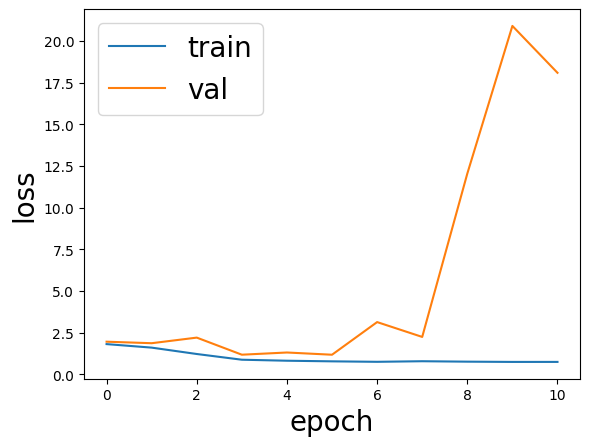

In [ ]:
plt.plot(train_loss, label='train')
plt.plot(val_loss, label='val')
plt.legend(fontsize=20)
plt.xlabel('epoch',fontsize=20)
plt.ylabel('loss', fontsize=20)
plt.show()

## 4.2 Treating Covariate Row

In [ ]:
!git clone https://github.com/RyanWangZf/SurvTRACE

Cloning into 'SurvTRACE'...
remote: Enumerating objects: 87, done.
remote: Counting objects: 100% (87/87), done.
remote: Compressing objects: 100% (67/67), done.
remote: Total 87 (delta 39), reused 58 (delta 18), pack-reused 0
Unpacking objects: 100% (87/87), 146.75 KiB | 4.58 MiB/s, done.


In [ ]:
!pip install -r /content/SurvTRACE/requirements.txt

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 5.0 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × pip subprocess to install build dependencies did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Installing build dependencies ... error
error: subprocess-exited-with-error

× pip subprocess to install build dependencies did not run successfully.
│ exit code: 1
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.


In [ ]:
%cd /content/SurvTRACE

/content/SurvTRACE


In [ ]:
!pwd

/content/SurvTRACE


In [ ]:
%cd survtrace

/content/SurvTRACE/survtrace


In [ ]:
!pip install scikit-survival
!pip install torchtuples
!pip install pycox

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 72.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.9/41.9 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.7/73.7 kB 6.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 63.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 412.3/412.3 kB 35.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.8/138.8 kB 17.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.8/49.8 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 44.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.1/93.1 kB 12.3 MB/s eta 0:00:00
  Created wheel for feather-format: filename=feather_format-0.4.1-py3-none-any.whl size=2440 sha256=f9ad36b8edd7f70cde1a46541d043d2e9a1edf037c0e77131f2af4a0651

In [ ]:
import math
import os
import random
import itertools


import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from google.colab import drive, files

import torch

In [ ]:
import pdb
from collections import defaultdict
import matplotlib.pyplot as plt

from SurvTRACE.survtrace.dataset import load_data
from SurvTRACE.survtrace.evaluate_utils import Evaluator
from SurvTRACE.survtrace.utils import set_random_seed
from SurvTRACE.survtrace.model import SurvTraceSingle
from SurvTRACE.survtrace.train_utils import Trainer
from SurvTRACE.survtrace.config import STConfig

# define the setup parameters
STConfig['data'] = 'metabric'

set_random_seed(STConfig['seed'])

hparams = {
    'batch_size': 64,
    'weight_decay': 1e-4,
    'learning_rate': 1e-3,
    'epochs': 20,
}

In [ ]:
from google.colab import drive, files

files.upload()

Saving pbc2_data_proccessed_auton_covariate.csv to pbc2_data_proccessed_auton_covariate.csv


{'pbc2_data_proccessed_auton_covariate.csv': b'event,time,seq_id,seq_time_id,seq_temporal_SGOT,seq_temporal_age,seq_temporal_albumin,seq_temporal_alkaline,seq_temporal_platelets,seq_temporal_prothrombin,seq_temporal_serBilir,seq_temporal_serChol,seq_static_sex_1.0,seq_temporal_ascites_1.0,seq_temporal_ascites_2.0,seq_temporal_drug_1.0,seq_temporal_edema_1.0,seq_temporal_edema_2.0,seq_temporal_hepatomegaly_1.0,seq_temporal_hepatomegaly_2.0,seq_temporal_histologic_1.0,seq_temporal_histologic_2.0,seq_temporal_histologic_3.0,seq_temporal_spiders_1.0,seq_temporal_spiders_2.0\n1.0,0.569488555470374,0,0.569488555470374,-1.4852630488930405,0.24805770064771565,-0.8945752575425933,0.19553238001053916,-0.5291009982582108,0.1367681129300899,3.281889922503343,1.1690163261862832e-16,0,1,0,0,1,0,1,0,0,0,1,1,0\n1.0,0.569488555470374,0,1.09517029898149,0.1954875455927532,0.24805770064771565,-1.5706464983148143,0.2856128124822622,-0.4560223212497723,0.8131321598383678,2.0158767008480454,-0.4694608324507

In [ ]:
import pandas as pd
from SurvTRACE.survtrace.utils import LabelTransform
from sklearn.preprocessing import KBinsDiscretizer, LabelEncoder, StandardScaler

get_target = lambda df: (df['duration'].values, df['event'].values)
df = pd.read_csv("/content/SurvTRACE/survtrace/pbc2_data_proccessed_auton_covariate.csv")

In [ ]:
df.head()

,event,time,seq_id,seq_time_id,seq_temporal_SGOT,seq_temporal_age,seq_temporal_albumin,seq_temporal_alkaline,seq_temporal_platelets,seq_temporal_prothrombin,...,seq_temporal_drug_1.0,seq_temporal_edema_1.0,seq_temporal_edema_2.0,seq_temporal_hepatomegaly_1.0,seq_temporal_hepatomegaly_2.0,seq_temporal_histologic_1.0,seq_temporal_histologic_2.0,seq_temporal_histologic_3.0,seq_temporal_spiders_1.0,seq_temporal_spiders_2.0
0,1.0,0.569489,0,0.569489,-1.485263,0.248058,-0.894575,0.195532,-0.529101,0.136768,...,0,1,0,1,0,0,0,1,1,0
1,1.0,0.569489,0,1.095170,0.195488,0.248058,-1.570646,0.285613,-0.456022,0.813132,...,0,1,0,1,0,0,0,1,1,0
2,0.0,14.152338,1,5.319790,-0.442126,1.292856,-1.431455,-0.605844,-1.395605,0.339677,...,0,1,0,1,0,0,1,0,1,0
3,0.0,14.152338,1,6.261636,-0.046806,1.292856,-1.172958,-0.512364,-1.259888,0.339677,...,0,1,0,1,0,0,1,0,1,0
4,0.0,14.152338,1,7.266455,0.293680,1.292856,-1.312149,-0.443529,-1.364286,0.339677,...,0,1,0,1,0,0,1,0,1,0


In [ ]:
df_temp = df.loc[0:, ['seq_id', 'seq_time_id']]
df_event_time_temp = df.loc[0:, ['event', 'time']]
df = df.drop(columns=['seq_id', 'seq_time_id'])

In [ ]:
df_temp.head()

,seq_id,seq_time_id
0,0,0.569489
1,0,1.095170
2,1,5.319790
3,1,6.261636
4,1,7.266455


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1945 entries, 0 to 1944
Data columns (total 23 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   event                          1945 non-null   float64
 1   time                           1945 non-null   float64
 2   seq_temporal_SGOT              1945 non-null   float64
 3   seq_temporal_age               1945 non-null   float64
 4   seq_temporal_albumin           1945 non-null   float64
 5   seq_temporal_alkaline          1945 non-null   float64
 6   seq_temporal_platelets         1945 non-null   float64
 7   seq_temporal_prothrombin       1945 non-null   float64
 8   seq_temporal_serBilir          1945 non-null   float64
 9   seq_temporal_serChol           1945 non-null   float64
 10  seq_static_sex_1.0             1945 non-null   int64  
 11  seq_temporal_ascites_1.0       1945 non-null   int64  
 12  seq_temporal_ascites_2.0       1945 non-null   i

In [ ]:
# df.rename(columns = {'seq_out_time_to_event':'duration', 'seq_out_event':'event'}, inplace = True)
df.rename(columns = {'time':'duration'}, inplace = True)

In [ ]:
import numpy as np
from SurvTRACE.survtrace.config import STConfig
def pbc2_proccess_covariate(df):
  horizons = [.25, .5, .75]
  times = np.quantile(df["duration"][df["event"]==1.0], horizons).tolist()

  # cols_standardize = ["seq_temporal_SGOT", "seq_temporal_age", "seq_temporal_albumin", "seq_temporal_alkaline", "seq_temporal_platelets", "seq_temporal_prothrombin", "seq_temporal_serBilir", "seq_temporal_serChol"]
  # cols_categorical = ["seq_static_sex", "seq_temporal_ascites", "seq_temporal_drug", "seq_temporal_edema", "seq_temporal_hepatomegaly", "seq_temporal_histologic", "seq_temporal_spiders"]

  cols_standardize = ["seq_temporal_SGOT", "seq_temporal_age", "seq_temporal_albumin", "seq_temporal_alkaline", "seq_temporal_platelets", "seq_temporal_prothrombin", "seq_temporal_serBilir", "seq_temporal_serChol"]
  cols_categorical = ['seq_static_sex_1.0', 'seq_temporal_ascites_1.0', 'seq_temporal_ascites_2.0', 'seq_temporal_drug_1.0', 'seq_temporal_edema_1.0', 'seq_temporal_edema_2.0', 'seq_temporal_hepatomegaly_1.0', 'seq_temporal_hepatomegaly_2.0', 'seq_temporal_histologic_1.0', 'seq_temporal_histologic_2.0', 'seq_temporal_histologic_3.0', 'seq_temporal_spiders_1.0', 'seq_temporal_spiders_2.0']

  df_feat = df.drop(["duration","event"],axis=1)
  df_feat_standardize = df_feat[cols_standardize]
  df_feat_standardize_disc = StandardScaler().fit_transform(df_feat_standardize)
  df_feat_standardize_disc = pd.DataFrame(df_feat_standardize_disc, columns=cols_standardize)

  # must be categorical feature ahead of numerical features!
  df_feat = pd.concat([df_feat[cols_categorical], df_feat_standardize_disc], axis=1)

  vocab_size = 0
  for _,feat in enumerate(cols_categorical):
      df_feat[feat] = LabelEncoder().fit_transform(df_feat[feat]).astype(float) + vocab_size
      vocab_size = df_feat[feat].max() + 1
  print(vocab_size)

  # get the largest duraiton time
  max_duration_idx = df["duration"].argmax()

  # # Hung edited here
  df_train = df_feat.iloc[0:] #


  # assign cuts
  labtrans = LabelTransform(cuts=np.array([df["duration"].min()]+times+[df["duration"].max()]))
  labtrans.fit(*get_target(df.loc[df_train.index]))
  y = labtrans.transform(*get_target(df)) # y = (discrete duration, event indicator)
  df_y_train = pd.DataFrame({"duration": y[0][df_train.index], "event": y[1][df_train.index], "proportion": y[2][df_train.index]}, index=df_train.index)
  STConfig['labtrans'] = labtrans
  STConfig['num_numerical_feature'] = int(len(cols_standardize))
  STConfig['num_categorical_feature'] = int(len(cols_categorical))
  STConfig['num_feature'] = int(len(df_train.columns))
  STConfig['vocab_size'] = int(vocab_size)
  STConfig['duration_index'] = labtrans.cuts
  STConfig['out_feature'] = int(labtrans.out_features)
  print("______")
  print(int(len(cols_standardize)))
  print("______")
  print(int(len(cols_categorical)))
  print("______")
  print(int(len(df_train.columns)))
  print("______")
  print(int(vocab_size))
  print("______")
  print(labtrans.cuts)
  print("______")
  print(int(labtrans.out_features))

  return y, df, df_train, df_y_train

In [ ]:
y, df, df_train, df_y_train = pbc2_proccess_covariate(df)

26.0
______
8
______
13
______
21
______
26
______
[2.73792575e-03 3.83309605e-02 1.86178951e-01 4.73661154e-01
 1.43056620e+01]
______
4


/content/SurvTRACE/survtrace/utils.py:78: UserWarning: Got event/censoring at start time. Should be removed! It is set s.t. it has no contribution to loss.
  warnings.warn("""Got event/censoring at start time. Should be removed! It is set s.t. it has no contribution to loss.""")


In [ ]:
df_train.head()

,seq_static_sex_1.0,seq_temporal_ascites_1.0,seq_temporal_ascites_2.0,seq_temporal_drug_1.0,seq_temporal_edema_1.0,seq_temporal_edema_2.0,seq_temporal_hepatomegaly_1.0,seq_temporal_hepatomegaly_2.0,seq_temporal_histologic_1.0,seq_temporal_histologic_2.0,...,seq_temporal_spiders_1.0,seq_temporal_spiders_2.0,seq_temporal_SGOT,seq_temporal_age,seq_temporal_albumin,seq_temporal_alkaline,seq_temporal_platelets,seq_temporal_prothrombin,seq_temporal_serBilir,seq_temporal_serChol
0,0.0,3.0,4.0,6.0,9.0,10.0,13.0,14.0,16.0,18.0,...,23.0,24.0,-1.485263,0.248058,-0.894575,0.195532,-0.529101,0.136768,3.281890,1.242080e-16
1,0.0,3.0,4.0,6.0,9.0,10.0,13.0,14.0,16.0,18.0,...,23.0,24.0,0.195488,0.248058,-1.570646,0.285613,-0.456022,0.813132,2.015877,-4.694608e-01
2,0.0,3.0,4.0,6.0,9.0,10.0,13.0,14.0,16.0,19.0,...,23.0,24.0,-0.442126,1.292856,-1.431455,-0.605844,-1.395605,0.339677,0.172710,-6.589138e-01
3,0.0,3.0,4.0,6.0,9.0,10.0,13.0,14.0,16.0,19.0,...,23.0,24.0,-0.046806,1.292856,-1.172958,-0.512364,-1.259888,0.339677,-0.013468,-6.036567e-01
4,0.0,3.0,4.0,6.0,9.0,10.0,13.0,14.0,16.0,19.0,...,23.0,24.0,0.293680,1.292856,-1.312149,-0.443529,-1.364286,0.339677,0.098239,1.242080e-16


In [ ]:
df_y_train.head()

,duration,event,proportion
0,3,1.0,0.006928
1,3,1.0,0.006928
2,3,0.0,0.988915
3,3,0.0,0.988915
4,3,0.0,0.988915


In [ ]:
cols_standardize = ["seq_temporal_SGOT", "seq_temporal_age", "seq_temporal_albumin", "seq_temporal_alkaline", "seq_temporal_platelets", "seq_temporal_prothrombin", "seq_temporal_serBilir", "seq_temporal_serChol"]
cols_categorical = ['seq_static_sex_1.0', 'seq_temporal_ascites_1.0', 'seq_temporal_ascites_2.0', 'seq_temporal_drug_1.0', 'seq_temporal_edema_1.0', 'seq_temporal_edema_2.0', 'seq_temporal_hepatomegaly_1.0', 'seq_temporal_hepatomegaly_2.0', 'seq_temporal_histologic_1.0', 'seq_temporal_histologic_2.0', 'seq_temporal_histologic_3.0', 'seq_temporal_spiders_1.0', 'seq_temporal_spiders_2.0']

print(len(cols_categorical))

13


In [ ]:
# Chỗ này app id cho cả 2 để xử lý thành 1 covariate data
# embedding to 21 features only

In [ ]:
df_train = pd.concat([df_train, df_temp['seq_id']], axis=1, join='inner')
df_y_train = pd.concat([df_y_train, df_temp['seq_id']], axis=1, join='inner')

In [ ]:
df_train.head()

,seq_static_sex_1.0,seq_temporal_ascites_1.0,seq_temporal_ascites_2.0,seq_temporal_drug_1.0,seq_temporal_edema_1.0,seq_temporal_edema_2.0,seq_temporal_hepatomegaly_1.0,seq_temporal_hepatomegaly_2.0,seq_temporal_histologic_1.0,seq_temporal_histologic_2.0,...,seq_temporal_SGOT,seq_temporal_age,seq_temporal_albumin,seq_temporal_alkaline,seq_temporal_platelets,seq_temporal_prothrombin,seq_temporal_serBilir,seq_temporal_serChol,seq_id,seq_id
0,0.0,3.0,4.0,6.0,9.0,10.0,13.0,14.0,16.0,18.0,...,-1.485263,0.248058,-0.894575,0.195532,-0.529101,0.136768,3.281890,1.242080e-16,0,0
1,0.0,3.0,4.0,6.0,9.0,10.0,13.0,14.0,16.0,18.0,...,0.195488,0.248058,-1.570646,0.285613,-0.456022,0.813132,2.015877,-4.694608e-01,0,0
2,0.0,3.0,4.0,6.0,9.0,10.0,13.0,14.0,16.0,19.0,...,-0.442126,1.292856,-1.431455,-0.605844,-1.395605,0.339677,0.172710,-6.589138e-01,1,1
3,0.0,3.0,4.0,6.0,9.0,10.0,13.0,14.0,16.0,19.0,...,-0.046806,1.292856,-1.172958,-0.512364,-1.259888,0.339677,-0.013468,-6.036567e-01,1,1
4,0.0,3.0,4.0,6.0,9.0,10.0,13.0,14.0,16.0,19.0,...,0.293680,1.292856,-1.312149,-0.443529,-1.364286,0.339677,0.098239,1.242080e-16,1,1


In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1945 entries, 0 to 1944
Data columns (total 22 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   seq_static_sex_1.0             1945 non-null   float64
 1   seq_temporal_ascites_1.0       1945 non-null   float64
 2   seq_temporal_ascites_2.0       1945 non-null   float64
 3   seq_temporal_drug_1.0          1945 non-null   float64
 4   seq_temporal_edema_1.0         1945 non-null   float64
 5   seq_temporal_edema_2.0         1945 non-null   float64
 6   seq_temporal_hepatomegaly_1.0  1945 non-null   float64
 7   seq_temporal_hepatomegaly_2.0  1945 non-null   float64
 8   seq_temporal_histologic_1.0    1945 non-null   float64
 9   seq_temporal_histologic_2.0    1945 non-null   float64
 10  seq_temporal_histologic_3.0    1945 non-null   float64
 11  seq_temporal_spiders_1.0       1945 non-null   float64
 12  seq_temporal_spiders_2.0       1945 non-null   f

In [ ]:
df_y_train.head()

,duration,event,proportion,seq_id
0,3,1.0,0.006928,0
1,3,1.0,0.006928,0
2,3,0.0,0.988915,1
3,3,0.0,0.988915,1
4,3,0.0,0.988915,1


In [ ]:
# Check sequence length
def padded_mask_processing(df_train):
  max_seq_length = df_train.groupby("seq_id").size().max()
  num_patients = len(df_train["seq_id"].unique())
  print(max_seq_length, max_seq_length)
  padded_patients = []
  masks = []
  for patient_id, patient_data in df_train.groupby("seq_id"):
      padding_rows = max_seq_length - len(patient_data)

      current_patients = torch.zeros(max_seq_length, df_train.shape[1])
      curent_masks = torch.zeros(max_seq_length)
      current_patients[:len(patient_data)] = torch.tensor(patient_data.to_numpy())
      curent_masks[:len(patient_data)] = 1
      masks.append(curent_masks)
      padded_patients.append(current_patients)
  padded_patients = torch.stack(padded_patients)
  masks = torch.stack(masks)
  padded_patients = padded_patients[:,:,1:]
  return masks, padded_patients


In [ ]:
masks, padded_patients = padded_mask_processing(df_train)

16 16


In [ ]:
padded_patients.shape

torch.Size([312, 16, 21])

In [ ]:
masks.shape

torch.Size([312, 16])

In [ ]:
df_y_train = df_y_train.drop_duplicates(subset='seq_id', keep='last')

In [ ]:
df_y_train = df_y_train.reset_index(drop=True)

In [ ]:
df_y_train = df_y_train.drop(columns=['seq_id'])

In [ ]:
df_y_train

,duration,event,proportion
0,3,1.0,0.006928
1,3,0.0,0.988915
2,3,1.0,0.019002
3,2,1.0,0.314286
4,3,0.0,0.263658
...,...,...,...
307,3,0.0,0.326405
308,3,0.0,0.294933
309,3,0.0,0.284046
310,3,0.0,0.264252


In [ ]:
df_temp = df_temp.drop_duplicates(subset='seq_id', keep='last')

In [ ]:
df_temp = df_temp.reset_index(drop=True)
df_temp = df_temp.drop(columns=['seq_id'])

In [ ]:
df_temp

,seq_time_id
0,1.095170
1,14.152338
2,2.770781
3,5.270507
4,4.120578
...,...
307,4.988501
308,4.553171
309,4.402585
310,4.128792


### 4.2.1 Model

In [ ]:
!pip install tensorflow transformers
!pip install tensorflow-addons
!pip install torch
!pip install numba
!pip install livelossplot
!pip install auton-survival

In [ ]:
import math
import os
import random
import itertools


import numpy as np
import pandas as pd
import tensorflow as tf
import tensorflow_addons as tfa
import matplotlib.pyplot as plt

from google.colab import drive, files
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing.sequence import pad_sequences
from livelossplot import PlotLossesKeras
from IPython.display import clear_output
from auton_survival import datasets, preprocessing, models
from sklearn.model_selection import train_test_split

import torch
from torch import nn, matmul
from torch.nn.functional import softmax


clear_output()

In [ ]:
class CustomTransformerEncoderLayer(nn.Module):
    def __init__(self, embed_dim, num_heads, ffn_hidden_dim):
        super(CustomTransformerEncoderLayer, self).__init__()
        self.self_attn = nn.MultiheadAttention(embed_dim, num_heads, batch_first=True)
        self.norm1 = nn.LayerNorm(embed_dim)
        self.ffn = nn.Sequential(
            nn.Linear(embed_dim, ffn_hidden_dim),
            nn.ReLU(),
            nn.Linear(ffn_hidden_dim, embed_dim)
        )
        self.norm2 = nn.LayerNorm(embed_dim)

    def forward(self, x, masks):
        attn_output, attn_output_weights = self.self_attn(x, x, x, key_padding_mask=(1-masks).bool())
        x = self.norm1(x + attn_output)
        ffn_output = self.ffn(x)
        x = self.norm2(x + ffn_output)
        return x

In [ ]:
class TransformerClassifier(nn.Module):
    def __init__(self, input_dim, seq_length, embed_dim, num_heads, ffn_hidden_dim, num_layers, num_classes):
        super(TransformerClassifier, self).__init__()
        self.embedding = nn.Linear(input_dim, embed_dim)
        self.positional_encoding = self.create_positional_encoding(seq_length, embed_dim)
        self.transformer_layers = nn.ModuleList([
            CustomTransformerEncoderLayer(embed_dim, num_heads, ffn_hidden_dim)
            for _ in range(num_layers)
        ])
        self.global_avg_pool = nn.AdaptiveAvgPool1d(1)
        self.feature_layer = nn.Linear(embed_dim, 21)
        self.classifier = nn.Linear(21, num_classes)

    def create_positional_encoding(self, seq_length, embed_dim):
        position = torch.arange(0, seq_length, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, embed_dim, 2).float() * (-torch.log(torch.tensor(10000.0)) / embed_dim))
        pos_enc = torch.zeros(seq_length, embed_dim)
        pos_enc[:, 0::2] = torch.sin(position * div_term)
        pos_enc[:, 1::2] = torch.cos(position * div_term)
        return pos_enc.unsqueeze(0)

    def forward(self, x, masks):
        x = self.embedding(x)
        x = x + self.positional_encoding
        for layer in self.transformer_layers:
            x = layer(x, masks)
        x = x.permute(0, 2, 1)
        x = self.global_avg_pool(x)
        x = x.squeeze(-1)  # Remove the last dimension
        x = self.feature_layer(x)
        # x = self.classifier(x)
        return F.softmax(x, dim=1)


In [ ]:
X_features_data_tensor = padded_patients
Y_labels_data_tensor = torch.tensor(df_y_train.values)

In [ ]:
import torch
from torch.utils.data import TensorDataset

X_train, X_val, y_train, y_val, masks_train, masks_val = train_test_split(X_features_data_tensor, Y_labels_data_tensor, masks, test_size=0.1)
train_data = TensorDataset(X_train, y_train, masks_train)
val_data = TensorDataset(X_val, y_val, masks_val)

ValueError: ignored

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Hyperparameters
input_dim = 26
embed_dim = 16
num_heads = 2
ffn_hidden_dim = 64
num_layers = 2


batch_size = 1
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_data, batch_size=batch_size, shuffle=False)

# Set up training configurations
input_dim = X_features_data_tensor.size(2)
seq_length = X_features_data_tensor.size(1)
num_classes = 2
model = TransformerClassifier(input_dim, seq_length, embed_dim, num_heads, ffn_hidden_dim, num_layers, num_classes)


In [ ]:
X_train[0]

tensor([[ 3.0000e+00,  4.0000e+00,  6.0000e+00,  9.0000e+00,  1.0000e+01,
          1.2000e+01,  1.4000e+01,  1.6000e+01,  1.8000e+01,  2.1000e+01,
          2.3000e+01,  2.4000e+01,  2.6069e+00, -1.2184e+00, -2.1473e+00,
          5.4481e-01, -1.0511e+00,  7.3739e+00,  2.2951e+00, -1.6220e+00,
          1.2700e+02],
        [ 2.0000e+00,  4.0000e+00,  6.0000e+00,  9.0000e+00,  1.0000e+01,
          1.2000e+01,  1.4000e+01,  1.6000e+01,  1.8000e+01,  2.1000e+01,
          2.3000e+01,  2.4000e+01,  8.0760e-01, -1.2184e+00, -1.0934e+00,
          4.5218e-01, -1.1137e+00,  1.4895e+00,  2.3882e+00,  1.2421e-16,
          1.2700e+02],
        [ 2.0000e+00,  4.0000e+00,  6.0000e+00,  9.0000e+00,  1.0000e+01,
          1.3000e+01,  1.4000e+01,  1.6000e+01,  1.8000e+01,  2.1000e+01,
          2.3000e+01,  2.4000e+01,  3.5162e+00, -1.2184e+00, -3.9544e-02,
          4.6407e-01, -1.2390e+00,  1.4219e+00,  2.7606e+00, -1.2036e+00,
          1.2700e+02],
        [ 2.0000e+00,  4.0000e+00,  6.0000e

In [ ]:
masks_train[0]

tensor([1., 1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [ ]:
a = masks_train[0].unsqueeze(0)
output = model(X_train[0], a)

In [ ]:
output.shape

torch.Size([1, 21])

In [ ]:
# Continue to code in this
# please change config for this

#### 4.2.1.1 Pretrained -> Embeddings -> Putting To SurvTrace Model

In [ ]:
Y_labels = Y_labels_data_tensor[:,1]

In [ ]:
Y_labels = Y_labels.long()

In [ ]:
import torch
from torch.utils.data import TensorDataset

X_train, X_val, y_train, y_val, masks_train, masks_val = train_test_split(X_features_data_tensor, Y_labels, masks, test_size=0.3)
train_data = TensorDataset(X_train, y_train, masks_train)
val_data = TensorDataset(X_val, y_val, masks_val)

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Hyperparameters
input_dim = 26
embed_dim = 16
num_heads = 2
ffn_hidden_dim = 64
num_layers = 2


batch_size = 1
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_data, batch_size=batch_size, shuffle=False)

# Set up training configurations
input_dim = X_features_data_tensor.size(2)
seq_length = X_features_data_tensor.size(1)
num_classes = len(torch.unique(Y_labels_data_tensor))
model = TransformerClassifier(input_dim, seq_length, embed_dim, num_heads, ffn_hidden_dim, num_layers, num_classes)


In [ ]:
# HUNG: IMPORTANCE. IF YOU KEEP nn.CrossEntropyLoss(), this loss will return a number!!!!
# criterion = nn.NLLLoss(reduction="none")
criterion = nn.CrossEntropyLoss(reduction="none")
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=0.01)

In [ ]:
# Train the model
num_epochs = 40
train_loss_his = []
val_loss_his = []
val_accuracy_his = []

patience = 10
best_val_loss = None
epochs_since_best_val_loss = 0

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for batch_idx, (data, target, label_mask) in enumerate(train_loader):
        optimizer.zero_grad()
        output = model(data, label_mask)
        loss = criterion(output, target)
        # Assume loss has shape (B, S, D). Assume mask has shape (B, S)
        # Apply label mask to the loss.
        # In the label. Assume 1 is NOT PAD, and 0 is pad.
        loss = (loss * label_mask.unsqueeze(-1).float())

        # Average over the third dimension
        loss = loss.mean(-1)

        # Average over each sequence (dimension 1).
        # Since each sequence has different length. We need to do this
        loss = torch.sum(loss, dim=-1) / torch.sum(label_mask, dim=-1, keepdim=True)

        # Then average over the batch
        loss = loss.mean()
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

    # Evaluate on validation set
    model.eval()
    val_running_loss = 0.0
    val_preds = []
    val_targets = []
    with torch.no_grad():
        for batch_idx, (data, target, masks) in enumerate(val_loader):
            output = model(data, masks)
            loss = criterion(output, target)
            val_running_loss += loss.item()
            preds = output.argmax(dim=1).cpu().numpy()
            val_preds.extend(preds)
            val_targets.extend(target.cpu().numpy())

    # Calculate the accuracy of the model on the validation set
    val_accuracy = accuracy_score(val_targets, val_preds)

    print(f"Epoch {epoch + 1}/{num_epochs}, "
          f"Training Loss: {running_loss / len(train_loader)}, "
          f"Validation Loss: {val_running_loss / len(val_loader)}, "
          f"Validation Accuracy: {val_accuracy}")

    train_loss_his.append(running_loss / len(train_loader))
    val_loss_his.append(val_running_loss / len(val_loader))
    val_accuracy_his.append(val_accuracy)
    if best_val_loss is None or abs(val_running_loss) < abs(best_val_loss):
        best_val_loss = val_running_loss
        epochs_since_best_val_loss = 0
    else:
        epochs_since_best_val_loss += 1

    if epochs_since_best_val_loss > patience:
        print(f"Early stopping triggered. No improvement in validation loss for {patience} consecutive epochs.")
        break

In [ ]:
torch.save(model.state_dict(), 'pre_trained_timevisit.pth')

In [ ]:
# This function will be extended the weight we have before and to produce new embedding for the data
class TransformerClassifier_2(nn.Module):
    def __init__(self, input_dim, seq_length, embed_dim, num_heads, ffn_hidden_dim, num_layers, num_classes):
        super(TransformerClassifier_2, self).__init__()
        self.embedding = nn.Linear(input_dim, embed_dim)
        self.positional_encoding = self.create_positional_encoding(seq_length, embed_dim)
        self.transformer_layers = nn.ModuleList([
            CustomTransformerEncoderLayer(embed_dim, num_heads, ffn_hidden_dim)
            for _ in range(num_layers)
        ])
        self.global_avg_pool = nn.AdaptiveAvgPool1d(1)
        self.feature_layer = nn.Linear(embed_dim, 21)
        self.classifier = nn.Linear(21, num_classes)

    def create_positional_encoding(self, seq_length, embed_dim):
        position = torch.arange(0, seq_length, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, embed_dim, 2).float() * (-torch.log(torch.tensor(10000.0)) / embed_dim))
        pos_enc = torch.zeros(seq_length, embed_dim)
        pos_enc[:, 0::2] = torch.sin(position * div_term)
        pos_enc[:, 1::2] = torch.cos(position * div_term)
        return pos_enc.unsqueeze(0)

    def forward(self, x, masks):
        x = self.embedding(x)
        x = x + self.positional_encoding
        for layer in self.transformer_layers:
            x = layer(x, masks)
        x = x.permute(0, 2, 1)
        x = self.global_avg_pool(x)
        x = x.squeeze(-1)  # Remove the last dimension
        x = self.feature_layer(x)
        # x = self.classifier(x)
        return x

In [ ]:
model = TransformerClassifier_2(input_dim, seq_length, embed_dim, num_heads, ffn_hidden_dim, num_layers, num_classes)
pretrained_weights = torch.load('pre_trained_timevisit.pth')
model.load_state_dict(pretrained_weights)

<All keys matched successfully>

In [ ]:
masks, padded_patients = padded_mask_processing(df_train)

16 16


In [ ]:
a = masks_train[5].unsqueeze(0)
output = model(X_train[5], a)

In [ ]:
print(len(masks))
print(len(X_features_data_tensor))

312
312


In [ ]:
masks.shape

torch.Size([312, 16])

In [ ]:
X_features_data_tensor.shape

torch.Size([312, 16, 21])

In [ ]:
new_embedding = []
for i in range(len(masks)):
  a = masks[i].unsqueeze(0)
  output = model(X_features_data_tensor[i], a)
  new_embedding.append(output)

In [ ]:
new_embedding

In [ ]:
# Convert each tensor to a numpy array and stack them
numpy_arrays = [tensor.detach().numpy() for tensor in new_embedding]
numpy_array = np.stack(numpy_arrays, axis=-1) # this stacks along a new third dimension

In [ ]:
new_df = pd.DataFrame(numpy_array[0])
new_df = new_df.transpose()

In [ ]:
dataframe_for_survtrace = pd.concat([new_df, df_y_train],axis = 1)

In [ ]:
dataframe_for_survtrace

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,duration,event,proportion_1
0,-0.640790,8.601443,-0.821111,-0.821115,-0.821100,-0.821370,-0.821102,-0.821252,-0.821242,-0.821124,...,-0.821170,-0.821111,-0.821121,-0.821300,-0.821092,-0.821129,-0.821197,3,1.0,0.006928
1,2.690124,6.514240,-1.052684,-1.052686,-1.052673,-1.052894,-1.052674,-1.052777,-1.052789,-1.052690,...,-1.052723,-1.052681,-1.052690,-1.052828,-1.052667,-1.052695,-1.052747,3,0.0,0.988915
2,0.362566,7.969614,-0.890715,-0.890719,-0.890704,-0.890959,-0.890706,-0.890842,-0.890838,-0.890726,...,-0.890769,-0.890714,-0.890724,-0.890891,-0.890697,-0.890731,-0.890795,3,1.0,0.019002
3,1.734989,7.121678,-0.987260,-0.987262,-0.987248,-0.987484,-0.987250,-0.987367,-0.987372,-0.987268,...,-0.987305,-0.987257,-0.987266,-0.987417,-0.987242,-0.987273,-0.987329,2,1.0,0.314286
4,1.305060,7.377329,-0.955973,-0.955976,-0.955962,-0.956203,-0.955964,-0.956086,-0.956089,-0.955982,...,-0.956021,-0.955971,-0.955980,-0.956136,-0.955955,-0.955987,-0.956046,3,0.0,0.263658
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307,8.878254,-2.005367,-0.973298,-0.973299,-0.973294,-0.973274,-0.973297,-0.973238,-0.973278,-0.973288,...,-0.973279,-0.973294,-0.973291,-0.973261,-0.973298,-0.973291,-0.973281,3,0.0,0.326405
308,8.878800,-2.008549,-0.972989,-0.972991,-0.972986,-0.972966,-0.972989,-0.972929,-0.972970,-0.972980,...,-0.972971,-0.972986,-0.972982,-0.972953,-0.972990,-0.972983,-0.972973,3,0.0,0.294933
309,8.877302,-2.003212,-0.973398,-0.973399,-0.973394,-0.973375,-0.973397,-0.973338,-0.973378,-0.973388,...,-0.973379,-0.973394,-0.973391,-0.973361,-0.973398,-0.973391,-0.973381,3,0.0,0.284046
310,8.899765,-1.910742,-0.986023,-0.986024,-0.986019,-0.986003,-0.986022,-0.985964,-0.986005,-0.986013,...,-0.986004,-0.986019,-0.986016,-0.985988,-0.986023,-0.986016,-0.986007,3,0.0,0.264252


In [ ]:
list(dataframe_for_survtrace.columns)

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 'duration',
 'event',
 'proportion']

In [ ]:
dataframe_for_survtrace.rename(columns = {'proportion':'proportion_1'}, inplace = True)

In [ ]:
dataframe_for_survtrace.columns = dataframe_for_survtrace.columns.astype(str)

In [ ]:
dataframe_for_survtrace.to_csv('dataframe_for_survtrace.csv', index=False)

In [ ]:
import numpy as np
from SurvTRACE.survtrace.config import STConfig
def test_pbc2(df):
  horizons = [.25, .5, .75]
  times = np.quantile(df["duration"][df["event"]==1.0], horizons).tolist()

  cols_standardize = ['0','1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19','20','proportion_1']
  cols_categorical = []

  df_feat = df.drop(["duration","event"],axis=1)
  df_feat_standardize = df_feat[cols_standardize]
  df_feat_standardize_disc = StandardScaler().fit_transform(df_feat_standardize)
  df_feat_standardize_disc = pd.DataFrame(df_feat_standardize_disc, columns=cols_standardize)

  # must be categorical feature ahead of numerical features!
  df_feat = pd.concat([df_feat[cols_categorical], df_feat_standardize_disc], axis=1)

  vocab_size = 0
  for _,feat in enumerate(cols_categorical):
      df_feat[feat] = LabelEncoder().fit_transform(df_feat[feat]).astype(float) + vocab_size
      vocab_size = df_feat[feat].max() + 1
  print(vocab_size)

  # get the largest duraiton time
  max_duration_idx = df["duration"].argmax()
  # df_test = df_feat.drop(max_duration_idx).sample(frac=0.2)
  # df_train = df_feat.drop(df_test.index)
  # df_val = df_train.drop(max_duration_idx).sample(frac=0.2)
  # df_train = df_train.drop(df_val.index)


  # # Hung edited here
  df_train = df_feat.iloc[149:] #
  df_train = df_train.sample(frac=1)

  df_remaining = df_feat.iloc[:148] #
  df_remaining = df_remaining.sample(frac=1)

  # Now let's say you want to split the remaining data into test and validation sets
  df_test = df_remaining.sample(frac=0.5) # 20% of the training data for testing
  df_val = df_remaining.drop(df_test.index) # 20% of the training data for validating


  # assign cuts
  labtrans = LabelTransform(cuts=np.array([df["duration"].min()]+times+[df["duration"].max()]))
  labtrans.fit(*get_target(df.loc[df_train.index]))
  y = labtrans.transform(*get_target(df)) # y = (discrete duration, event indicator)
  df_y_train = pd.DataFrame({"duration": y[0][df_train.index], "event": y[1][df_train.index], "proportion": y[2][df_train.index]}, index=df_train.index)
  df_y_val = pd.DataFrame({"duration": y[0][df_val.index], "event": y[1][df_val.index],  "proportion": y[2][df_val.index]}, index=df_val.index)
  # df_y_test = pd.DataFrame({"duration": y[0][df_test.index], "event": y[1][df_test.index],  "proportion": y[2][df_test.index]}, index=df_test.index)
  df_y_test = pd.DataFrame({"duration": df['duration'].loc[df_test.index], "event": df['event'].loc[df_test.index]})
  STConfig['labtrans'] = labtrans
  STConfig['num_numerical_feature'] = int(len(cols_standardize))
  STConfig['num_categorical_feature'] = int(len(cols_categorical))
  STConfig['num_feature'] = int(len(df_train.columns))
  STConfig['vocab_size'] = int(vocab_size)
  STConfig['duration_index'] = labtrans.cuts
  STConfig['out_feature'] = int(labtrans.out_features)
  print("______")
  print(int(len(cols_standardize)))
  print("______")
  print(int(len(cols_categorical)))
  print("______")
  print(int(len(df_train.columns)))
  print("______")
  print(int(vocab_size))
  print("______")
  print(labtrans.cuts)
  print("______")
  print(int(labtrans.out_features))

  return y, df, df_train, df_y_train, df_test, df_y_test, df_val, df_y_val

In [ ]:
y, df, df_train, df_y_train, df_test, df_y_test, df_val, df_y_val = test_pbc2(dataframe_for_survtrace)

0


AssertionError: ignored

In [ ]:
# # Hung edited here
df_train = dataframe_for_survtrace.iloc[778:] #
df_train = df_train.sample(frac=1)

df_remaining = dataframe_for_survtrace.iloc[:777] #
df_remaining = df_remaining.sample(frac=1)

# Now let's say you want to split the remaining data into test and validation sets
df_test = df_remaining.sample(frac=0.5) # 20% of the training data for testing
df_val = df_remaining.drop(df_test.index) # 20% of the training data for validating

In [ ]:
  df_y_train = pd.DataFrame({"duration": y[0][df_train.index], "event": y[1][df_train.index], "proportion": y[2][df_train.index]}, index=df_train.index)
  df_y_val = pd.DataFrame({"duration": y[0][df_val.index], "event": y[1][df_val.index],  "proportion": y[2][df_val.index]}, index=df_val.index)
  # df_y_test = pd.DataFrame({"duration": y[0][df_test.index], "event": y[1][df_test.index],  "proportion": y[2][df_test.index]}, index=df_test.index)
  df_y_test = pd.DataFrame({"duration": df['duration'].loc[df_test.index], "event": df['event'].loc[df_test.index]})

In [ ]:
set_random_seed(STConfig['seed'])

hparams = {
    'batch_size': 2,
    'weight_decay': 1e-4,
    'learning_rate': 1e-3,
    'epochs': 20,
}

In [ ]:
# get model
model = SurvTraceSingle(STConfig)

# initialize a trainer
trainer = Trainer(model)

train_loss, val_loss = trainer.fit((df_train, df_y_train), (df_val, df_y_val),
        batch_size=hparams['batch_size'],
        epochs=hparams['epochs'],
        learning_rate=hparams['learning_rate'],
        weight_decay=hparams['weight_decay'],)


use pytorch-cuda for training.


UnboundLocalError: ignored

### 4.2.2 Other

In [ ]:
import numpy as np
from SurvTRACE.survtrace.config import STConfig
def test_pbc2(df):
  horizons = [.25, .5, .75]
  times = np.quantile(df["duration"][df["event"]==1.0], horizons).tolist()

  # cols_standardize = ["seq_temporal_SGOT", "seq_temporal_age", "seq_temporal_albumin", "seq_temporal_alkaline", "seq_temporal_platelets", "seq_temporal_prothrombin", "seq_temporal_serBilir", "seq_temporal_serChol"]
  # cols_categorical = ["seq_static_sex", "seq_temporal_ascites", "seq_temporal_drug", "seq_temporal_edema", "seq_temporal_hepatomegaly", "seq_temporal_histologic", "seq_temporal_spiders"]

  cols_standardize = ["seq_temporal_SGOT", "seq_temporal_age", "seq_temporal_albumin", "seq_temporal_alkaline", "seq_temporal_platelets", "seq_temporal_prothrombin", "seq_temporal_serBilir", "seq_temporal_serChol"]
  cols_categorical = ['seq_static_sex_1.0', 'seq_temporal_ascites_1.0', 'seq_temporal_ascites_2.0', 'seq_temporal_drug_1.0', 'seq_temporal_edema_1.0', 'seq_temporal_edema_2.0', 'seq_temporal_hepatomegaly_1.0', 'seq_temporal_hepatomegaly_2.0', 'seq_temporal_histologic_1.0', 'seq_temporal_histologic_2.0', 'seq_temporal_histologic_3.0', 'seq_temporal_spiders_1.0', 'seq_temporal_spiders_2.0']

  df_feat = df.drop(["duration","event"],axis=1)
  df_feat_standardize = df_feat[cols_standardize]
  df_feat_standardize_disc = StandardScaler().fit_transform(df_feat_standardize)
  df_feat_standardize_disc = pd.DataFrame(df_feat_standardize_disc, columns=cols_standardize)

  # must be categorical feature ahead of numerical features!
  df_feat = pd.concat([df_feat[cols_categorical], df_feat_standardize_disc], axis=1)

  vocab_size = 0
  for _,feat in enumerate(cols_categorical):
      df_feat[feat] = LabelEncoder().fit_transform(df_feat[feat]).astype(float) + vocab_size
      vocab_size = df_feat[feat].max() + 1
  print(vocab_size)

  # get the largest duraiton time
  max_duration_idx = df["duration"].argmax()
  # df_test = df_feat.drop(max_duration_idx).sample(frac=0.2)
  # df_train = df_feat.drop(df_test.index)
  # df_val = df_train.drop(max_duration_idx).sample(frac=0.2)
  # df_train = df_train.drop(df_val.index)


  # # Hung edited here
  df_train = df_feat.iloc[778:] #
  df_train = df_train.sample(frac=1)

  df_remaining = df_feat.iloc[:777] #
  df_remaining = df_remaining.sample(frac=1)

  # Now let's say you want to split the remaining data into test and validation sets
  df_test = df_remaining.sample(frac=0.5) # 20% of the training data for testing
  df_val = df_remaining.drop(df_test.index) # 20% of the training data for validating


  # assign cuts
  labtrans = LabelTransform(cuts=np.array([df["duration"].min()]+times+[df["duration"].max()]))
  labtrans.fit(*get_target(df.loc[df_train.index]))
  y = labtrans.transform(*get_target(df)) # y = (discrete duration, event indicator)
  df_y_train = pd.DataFrame({"duration": y[0][df_train.index], "event": y[1][df_train.index], "proportion": y[2][df_train.index]}, index=df_train.index)
  df_y_val = pd.DataFrame({"duration": y[0][df_val.index], "event": y[1][df_val.index],  "proportion": y[2][df_val.index]}, index=df_val.index)
  df_y_test = pd.DataFrame({"duration": y[0][df_test.index], "event": y[1][df_test.index],  "proportion": y[2][df_test.index]}, index=df_test.index)
  # df_y_test = pd.DataFrame({"duration": df['duration'].loc[df_test.index], "event": df['event'].loc[df_test.index]})
  STConfig['labtrans'] = labtrans
  STConfig['num_numerical_feature'] = int(len(cols_standardize))
  STConfig['num_categorical_feature'] = int(len(cols_categorical))
  STConfig['num_feature'] = int(len(df_train.columns))
  STConfig['vocab_size'] = int(vocab_size)
  STConfig['duration_index'] = labtrans.cuts
  STConfig['out_feature'] = int(labtrans.out_features)
  print("______")
  print(int(len(cols_standardize)))
  print("______")
  print(int(len(cols_categorical)))
  print("______")
  print(int(len(df_train.columns)))
  print("______")
  print(int(vocab_size))
  print("______")
  print(labtrans.cuts)
  print("______")
  print(int(labtrans.out_features))

  return y, df, df_train, df_y_train, df_test, df_y_test, df_val, df_y_val

In [ ]:
y, df, df_train, df_y_train, df_test, df_y_test, df_val, df_y_val = test_pbc2(df)

26.0
______
8
______
13
______
21
______
26
______
[2.73792575e-03 3.83309605e-02 1.86178951e-01 4.73661154e-01
 1.43056620e+01]
______
4


/content/SurvTRACE/survtrace/utils.py:78: UserWarning: Got event/censoring at start time. Should be removed! It is set s.t. it has no contribution to loss.
  warnings.warn("""Got event/censoring at start time. Should be removed! It is set s.t. it has no contribution to loss.""")


In [ ]:
df.head()

,event,duration,seq_temporal_SGOT,seq_temporal_age,seq_temporal_albumin,seq_temporal_alkaline,seq_temporal_platelets,seq_temporal_prothrombin,seq_temporal_serBilir,seq_temporal_serChol,...,seq_temporal_drug_1.0,seq_temporal_edema_1.0,seq_temporal_edema_2.0,seq_temporal_hepatomegaly_1.0,seq_temporal_hepatomegaly_2.0,seq_temporal_histologic_1.0,seq_temporal_histologic_2.0,seq_temporal_histologic_3.0,seq_temporal_spiders_1.0,seq_temporal_spiders_2.0
0,1.0,0.569489,-1.485263,0.248058,-0.894575,0.195532,-0.529101,0.136768,3.281890,1.169016e-16,...,0,1,0,1,0,0,0,1,1,0
1,1.0,0.569489,0.195488,0.248058,-1.570646,0.285613,-0.456022,0.813132,2.015877,-4.694608e-01,...,0,1,0,1,0,0,0,1,1,0
2,0.0,14.152338,-0.442126,1.292856,-1.431455,-0.605844,-1.395605,0.339677,0.172710,-6.589138e-01,...,0,1,0,1,0,0,1,0,1,0
3,0.0,14.152338,-0.046806,1.292856,-1.172958,-0.512364,-1.259888,0.339677,-0.013468,-6.036567e-01,...,0,1,0,1,0,0,1,0,1,0
4,0.0,14.152338,0.293680,1.292856,-1.312149,-0.443529,-1.364286,0.339677,0.098239,1.169016e-16,...,0,1,0,1,0,0,1,0,1,0


In [ ]:
df_features_merged = pd.concat([df_train, df_test, df_val], ignore_index=True)
df_labels_merged = pd.concat([df_y_train, df_y_test, df_y_val], ignore_index=True)

In [ ]:
df_features_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1944 entries, 0 to 1943
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   seq_static_sex_1.0             1944 non-null   float64
 1   seq_temporal_ascites_1.0       1944 non-null   float64
 2   seq_temporal_ascites_2.0       1944 non-null   float64
 3   seq_temporal_drug_1.0          1944 non-null   float64
 4   seq_temporal_edema_1.0         1944 non-null   float64
 5   seq_temporal_edema_2.0         1944 non-null   float64
 6   seq_temporal_hepatomegaly_1.0  1944 non-null   float64
 7   seq_temporal_hepatomegaly_2.0  1944 non-null   float64
 8   seq_temporal_histologic_1.0    1944 non-null   float64
 9   seq_temporal_histologic_2.0    1944 non-null   float64
 10  seq_temporal_histologic_3.0    1944 non-null   float64
 11  seq_temporal_spiders_1.0       1944 non-null   float64
 12  seq_temporal_spiders_2.0       1944 non-null   f

In [ ]:
df_labels_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1944 entries, 0 to 1943
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   duration    1944 non-null   int64  
 1   event       1944 non-null   float32
 2   proportion  1944 non-null   float32
dtypes: float32(2), int64(1)
memory usage: 30.5 KB


In [ ]:
df_combine_processed = pd.concat([df_features_merged, df_labels_merged], axis=1, join='inner')

In [ ]:
df_combine_processed.head()

,seq_static_sex_1.0,seq_temporal_ascites_1.0,seq_temporal_ascites_2.0,seq_temporal_drug_1.0,seq_temporal_edema_1.0,seq_temporal_edema_2.0,seq_temporal_hepatomegaly_1.0,seq_temporal_hepatomegaly_2.0,seq_temporal_histologic_1.0,seq_temporal_histologic_2.0,...,seq_temporal_age,seq_temporal_albumin,seq_temporal_alkaline,seq_temporal_platelets,seq_temporal_prothrombin,seq_temporal_serBilir,seq_temporal_serChol,duration,event,proportion
0,0.0,3.0,4.0,6.0,8.0,11.0,12.0,14.0,16.0,19.0,...,-0.256493,-0.496886,-0.223427,-1.270328,-0.404323,0.023768,-1.142365e-01,3,1.0,0.165875
1,0.0,2.0,4.0,6.0,8.0,10.0,13.0,14.0,16.0,18.0,...,-0.456289,-0.556540,0.843092,1.256107,0.001495,0.526449,4.969419e+00,0,1.0,0.923077
2,0.0,2.0,4.0,7.0,8.0,10.0,12.0,14.0,17.0,18.0,...,-1.200861,0.974563,-0.862488,-0.717018,0.069132,-0.516150,-1.140440e+00,3,0.0,0.537807
3,0.0,2.0,4.0,6.0,8.0,10.0,12.0,14.0,16.0,19.0,...,1.435377,0.696181,-0.299060,0.629718,-0.269050,-0.423061,1.242080e-16,3,0.0,0.760491
4,0.0,2.0,4.0,7.0,8.0,10.0,13.0,14.0,16.0,18.0,...,0.682813,0.238838,-0.344100,-1.280767,1.962951,0.358889,1.242080e-16,2,1.0,0.476190


In [ ]:
import os
import pandas as pd
from google.colab import drive, files

files.upload()


{}

In [ ]:
PATH = "/content/metabric_data_merged_adsgan_auton.csv"

In [ ]:
time_event_df, min_max_df, len_cl = input_dataframe(PATH)

In [ ]:
min_max_df

,Z_Min,Z_Max
age_at_diagnosis,-2.955900,2.404976
size,-1.767911,10.904128
lymph_nodes_positive,-0.470303,11.241139
lymph_nodes_removed,-1.556040,4.265612
NPI,-2.634228,2.032500
...,...,...
site.4_1,0.000000,1.000000
Genefu_1,0.000000,1.000000
Genefu.1_1,0.000000,1.000000
Genefu.2_1,0.000000,1.000000


_____


In [ ]:
import math
import numpy as np
import pandas as pd

from fractions import Fraction

In [ ]:
def generate_u(n_generate):
    samples = np.random.uniform(0, 1, n_generate)
    samples = pd.DataFrame(samples)
    samples = samples.transpose()
    return samples

In [ ]:
result = generate_u(1000)

In [ ]:
result

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,0.235029,0.812085,0.213003,0.225377,0.416378,0.748177,0.646533,0.112334,0.053077,0.381105,...,0.25333,0.217562,0.765524,0.426691,0.866418,0.096424,0.391657,0.778775,0.318049,0.904999


In [ ]:
def input_features(features):
    z_max = []
    z_min = []
    features_len = len(features)
    for i in features:
        if (type(i) is not list) or (type(i[0]) is str) or (type(i[1]) is str):
            print("Data error, please check again")
        else:
            if i[0] < i[1]:
                z_min.append(i[0])
                z_max.append(i[1])
            else:
                print(f"the value of min and max have contrasted at {i}, we have applied again for this")
                z_min.append(i[1])
                z_max.append(i[0])

    features_df = pd.DataFrame({'Z_Min': z_min, 'Z_Max': z_max})
    return features_len, features_df


def input_dataframe(path, cat_feat: list = [], num_feat: list = []):
    assert os.path.exists(path), "File not found, please check"
    df = pd.read_csv(path)
    try:
        time_event_df = df[['event', 'time']]
        df = df.drop(columns=['event', 'time'])
    except Exception as E:
        print(E)
    min_max_df = df.agg(['min', 'max'])
    features_len = len(list(df.columns))
    min_max_df = min_max_df.transpose()
    min_max_df = min_max_df.rename(columns={"min": "Z_Min", "max": "Z_Max"})
    return time_event_df, min_max_df, features_len


def generate_z(features_df, n_generate):
    results = pd.DataFrame()
    for index, row in features_df.iterrows():
        min_val, max_val = row['Z_Min'], row['Z_Max']
        if min_val == 0 and max_val == 1:
            samples = np.random.choice([0, 1], n_generate)
        else:
            samples = np.random.uniform(min_val, max_val, n_generate)
        results = pd.concat([results, pd.DataFrame([samples])])
    results = results.reset_index(drop=True)

    return results


def generate_u(n_generate):
    samples = np.random.uniform(0, 1, n_generate)
    return samples


def input_beta(beta_list: list = [], features_len: int = 0):
    assert len(beta_list) == features_len, "the length of features is not equal, please check"
    return beta_list


In [ ]:
import os
import pandas as pd
from google.colab import drive, files

files.upload()


In [ ]:
PATH = "/content/metabric_data_merged_adsgan_auton.csv"

In [ ]:
def finding_time_t(u, k, g, c):
    if not isinstance(k, int) and k != 0:
        k = Fraction.from_float(k).limit_denominator()

    exp_c = math.exp(c)  # Calculate exp(c) once and store the result
    ln_value = math.log(1 / (1 - u))
    right_hand_side = ln_value / exp_c

    if right_hand_side >= 0:
        t = g * right_hand_side ** (1 / k)
        return t
    else:
        return None  # Return None to indicate no solution

In [ ]:
def time_failure_calculation(n_generate: int = 5, features: list = [], path: str = "", k: float = 1.5, g: float = 1,
                             beta_list: list = []):
    if len(beta_list) == 0 or (len(features) == 0 and path is None):
        print("Error in data input, please check")
        return None
    if len(features) == 0:
        time_event_df, features_df, features_len = input_dataframe(path)
        z_generated = generate_z(features_df, n_generate)
    else:
        features_len, features_df = input_features(features)
        z_generated = generate_z(features_df, n_generate)

    beta_list = input_beta(beta_list, features_len)
    beta_list = np.array(beta_list)
    z_generated = np.array(z_generated)
    list_harzard = np.dot(z_generated.T, beta_list)
    u = generate_u(n_generate)

    list_failure_time = []
    for i in range(n_generate):
        result = finding_time_t(u[i], k, g, list_harzard[i])
        list_failure_time.append(result)
    z_generated_df = pd.DataFrame(z_generated).transpose()
    list_failure_time_df = pd.DataFrame(list_failure_time, columns=['duration'])
    full_generated_data = pd.concat([z_generated_df, list_failure_time_df],axis = 1)
    return z_generated_df, features_df.transpose(), list_failure_time_df, full_generated_data

In [ ]:
beta_list = np.random.uniform(-1, 5, 83)

In [ ]:
beta_list= [-0.8, 1.2]

In [ ]:
print(len(beta_list))

2


In [ ]:
n_generate = 2 # the number of samples want to generate
k = 1.5 # Sharp para
g = 1.0 # Scale para or called lambda

In [ ]:
z_generated, features_df, list_failure_time, full_generated_data = time_failure_calculation(n_generate = 100, features=[], path=PATH, beta_list=beta_list, k=k, g=g)

In [ ]:
features_df

,age_at_diagnosis,size,lymph_nodes_positive,lymph_nodes_removed,NPI,stage_1.0,stage_1.190352021,stage_2.0,stage_3.0,stage_4.0,...,int_clust_memb.9_1,site_1,site.1_1,site.2_1,site.3_1,site.4_1,Genefu_1,Genefu.1_1,Genefu.2_1,Genefu.3_1
Z_Min,-2.955900,-1.767911,-0.470303,-1.556040,-2.634228,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Z_Max,2.404976,10.904128,11.241139,4.265612,2.032500,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [ ]:
z_generated

,0,1,2,3,4,5,6,7,8,9,...,73,74,75,76,77,78,79,80,81,82
0,-2.814918,9.341674,9.559663,1.518570,0.779493,0.0,0.0,1.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0
1,1.803585,8.049588,4.473075,2.205103,-1.243650,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
2,0.088404,10.242416,6.233033,-1.430446,-1.103071,0.0,1.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0
3,-2.932177,8.259419,0.065768,3.510745,-0.198939,1.0,1.0,1.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0
4,-0.990768,9.806344,10.216899,3.176793,-0.831316,0.0,1.0,1.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.038233,-1.227175,7.839369,-0.335394,0.450796,1.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0
96,0.947782,5.560936,11.055721,1.293426,-0.317344,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0
97,-1.729051,7.527076,6.385236,0.841688,0.585394,1.0,0.0,1.0,0.0,1.0,...,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0
98,-2.447874,8.287797,8.935153,0.852769,-2.628299,0.0,1.0,1.0,1.0,0.0,...,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0


In [ ]:
list_failure_time_df

,0
0,1.438853e-31
1,2.722677e-25
2,1.128499e-28
3,2.064460e-27
4,1.335027e-32
...,...
95,7.793465e-32
96,6.762085e-33
97,1.278587e-35
98,5.589222e-21


In [ ]:
full_generated_data

,0,1,2,3,4,5,6,7,8,9,...,74,75,76,77,78,79,80,81,82,duration
0,-2.814918,9.341674,9.559663,1.518570,0.779493,0.0,0.0,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,5.863975e-36
1,1.803585,8.049588,4.473075,2.205103,-1.243650,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,4.544687e-27
2,0.088404,10.242416,6.233033,-1.430446,-1.103071,0.0,1.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,4.603609e-34
3,-2.932177,8.259419,0.065768,3.510745,-0.198939,1.0,1.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.437420e-25
4,-0.990768,9.806344,10.216899,3.176793,-0.831316,0.0,1.0,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,2.292245e-38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.038233,-1.227175,7.839369,-0.335394,0.450796,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,2.376998e-34
96,0.947782,5.560936,11.055721,1.293426,-0.317344,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.910678e-35
97,-1.729051,7.527076,6.385236,0.841688,0.585394,1.0,0.0,1.0,0.0,1.0,...,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,2.489140e-36
98,-2.447874,8.287797,8.935153,0.852769,-2.628299,0.0,1.0,1.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,6.925980e-31
